# Import Libraries

In [1]:
%matplotlib inline

import pandas as pd
import datetime 
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.backends.backend_pdf import PdfPages
import glob
import os
import getpass
import sqlalchemy
#import geoalchemy2
import sys
import itertools

#import peakutils

import statsmodels.api as sm
from scipy.fftpack import fft

from statsmodels.tsa.stattools import adfuller, acf, pacf
from statsmodels.stats.stattools import durbin_watson
#from sklearn.linear_model import LinearRegression, LassoLars, lars_path, lasso_path
#from sklearn.preprocessing import normalize
from statsmodels.tsa.arima_model import ARIMA

from scipy.stats import linregress
import matplotlib as mpl
import matplotlib.cm as cm


from stldecompose import decompose, forecast
from stldecompose.forecast_funcs import (naive,
                                         drift, 
                                         mean, 
                                         seasonal_naive)

#from shutil import copyfile
import pastas as ps

import io
import requests

import platform
from matplotlib import rcParams

import folium

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot,iplot_mpl,plot_mpl
import plotly.graph_objs as go

init_notebook_mode(connected=True)

from geoalchemy2 import Geometry, WKTElement
from sqlalchemy import *
import geopandas as gpd

import wellapplication as wa

from statsmodels.tsa.stattools import adfuller, acf, pacf
from statsmodels.stats.stattools import durbin_watson
from sklearn.linear_model import LinearRegression, LassoLars, lars_path, lasso_path
from sklearn.preprocessing import normalize
from statsmodels.tsa.arima_model import ARIMA


rcParams['figure.figsize'] = 15, 10
rcParams['pdf.fonttype'] = 42
rcParams['font.size'] = 14

In [2]:
from fireTS.models import NARX, DirectAutoRegressor
import pandas as pd
import os
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
%matplotlib notebook

ModuleNotFoundError: No module named 'fireTS'

https://github.com/jxx123/fireTS

https://github.com/jxx123/fireTS/blob/master/examples/Basic%20usage%20of%20NARX%20and%20DirectAutoregressor.ipynb

In [3]:
llpath = "G:/My Drive/Python/Pycharm/loggerloader/"
sys.path.append(llpath)
import loggerloader as ll

In [4]:
import importlib.util
spec = importlib.util.spec_from_file_location("dbconnect", "G:/My Drive/Python/dbconnect.py")
dbconnect = importlib.util.module_from_spec(spec)
spec.loader.exec_module(dbconnect)
engine = dbconnect.postconn_ugs()

# Define custom functions

In [4]:
def crosscorr(datax, datay, lag=0):
    ''' 
    http://stackoverflow.com/questions/33171413/cross-correlation-time-lag-correlation-with-pandas
    Lag-N cross correlation. 
    Parameters
    ----------
    lag : int, default 0
    datax, datay : pandas.Series objects of equal length

    Returns
    ----------
    crosscorr : float
    '''
    return datax.corr(datay.shift(lag))

def scatterColor(x0,y,w):
    """Creates scatter plot with points colored by variable.
    All input arrays must have matching lengths

    Arg:
        x0 (array): 
            array of x values
        y (array): 
            array of y values
        w (array): 
            array of scalar values

    Returns:
        slope and intercept of best fit line
    
    """
    import matplotlib as mpl
    import matplotlib.cm as cm
    cmap = plt.cm.get_cmap('RdYlBu')
    norm = mpl.colors.Normalize(vmin=w.min(), vmax=w.max())
    m = cm.ScalarMappable(norm=norm, cmap=cmap)
    m.set_array(w)
    sc = plt.scatter(x0, y, label='', color = m.to_rgba(w))

    xa = sm.add_constant(x0)

    est = sm.RLM(y, xa).fit()
    r2 = sm.WLS(y, xa, weights=est.weights).fit().rsquared
    slope = est.params[1]

    x_prime = np.linspace(np.min(x0),np.max(x0),100)[:, np.newaxis]
    x_prime = sm.add_constant(x_prime)
    y_hat = est.predict(x_prime)

    const = est.params[0]
    y2 = [i*slope + const for i in x0]

    plt.xlabel('Barometric Pressure (ft water)')
    plt.ylabel('Transducer Pressure (ft water)')
    lin = linregress(x0,y)
    x1 = np.arange(np.min(x0), np.max(x0),0.1)
    y1 = [i*lin[0]+lin[1] for i in x1]
    y2 = [i*slope+const for i in x1]
    plt.plot(x1,y1,c='g',label='simple linear regression m = {:.2f} b = {:.0f}, r^2 = {:.2f}'.format(lin[0],lin[1],lin[2]**2))
    plt.plot(x1,y2,c='r',label='rlm regression m = {:.2f} b = {:.0f}, r2 = {:.2f}'.format(slope,const,r2))
    plt.legend()
    cbar = plt.colorbar(m)

    cbar.set_label('Julian Date')

    return slope,const

In [5]:
def plotlystuff(datasets, colnames, chrttypes=None, datatitles=None, chrttitle = 'well', colors=None,
                two_yaxes = False, axisdesig= None, axislabels=['Levels','Barometric Pressure']):
    
    if chrttypes is None:
        chrttypes = ['lines']*len(datasets)
    
    if datatitles is None:
        datatitles = colnames
    
    if axisdesig is None:
        axisdesig = ['y1']*len(datasets)
        
    if colors is None:
        if len(datasets) <= 5: 
            colors = ['#228B22','#F7DC6F','#FF1493','#663399','#FF0000']
        else:
            colors = []
            for i in range(len(datasets)):
                colors[i] = '#{:02x}{:02x}{:02x}'.format(r(), r(), r())
        
    r = lambda: random.randint(0,255)
    
    modetypes = ['markers','lines+markers','lines']
    datum = {}
    
    for i in range(len(datasets)):
        datum['d' + str(i)] = go.Scatter(
            x=datasets[i].index,
            y=datasets[i][colnames[i]],
            name = datatitles[i],
            line = dict(color = colors[i]),
            mode = chrttypes[i],
            opacity = 0.8,
            yaxis = axisdesig[i])
        
    data = list(datum.values())

    layout = dict(
        title=chrttitle,
        xaxis=dict(
            rangeslider=dict(
                visible = True
            ),
            type='date',
            tickformat='%Y-%m-%d %H:%M'
        ),
        yaxis=dict(title=axislabels[0],
                   titlefont=dict(color='#1f77b4'),
                   tickfont=dict(color='#1f77b4')),
    )
    
    
    if two_yaxes:
        layout['yaxis2'] = dict(title=axislabels[1], titlefont=dict(color='#ff7f0e'),
                    tickfont=dict(color='#ff7f0e'),
                    anchor='x',
                    overlaying='y',
                    side='right',
                    position=0.15)

    fig = dict(data=data, layout=layout)
    iplot(fig, filename = 'well')
    return 

In [7]:
def calc_wat_year(df):
    df.loc[:,'month'] = df.index.month
    df.loc[:,'year'] = df.index.year
    df.loc[:,'doy'] = df.index.dayofyear
    df['water year'] = df.index.shift(-9,freq='M').year+1
    df['ones'] = 1
    df['water year doy'] = df['ones'].groupby(df['water year']).cumsum()
    df['doylen'] = df['ones'].groupby(df['water year']).count()
    df['water year doy1'] = df.apply(lambda df: df['doy']-273 if df['water year'] > df['year'] else df['doy']+92,1)
      return df

In [7]:
csvdrive = "G:/Shared drives/UGS_Groundwater/Projects/Transducers/to_upload/20191113/"


In [9]:
savefold = "G:/My Drive/WORK/Leland_Harris/intermediate_data/"
figfold = "G:/My Drive/WORK/Leland_Harris/figures/"

# Bring in Well Data

In [9]:
well_table = ll.pull_well_table(engine,loc_table='ugs_ngwmn_monitoring_locations')
well_table.to_pickle(savefold+"well_table.pickle")


In [10]:
pieznums = [1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1061,1062,1063,1064,1065,1066,1067,1068,1069,1079,1080]
sql = """SELECT * FROM ugs_ngwmn_monitoring_locations 
WHERE altlocationid IN(1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1061,1062,1063,1064,1065,1066,1067,1068,1069,1079,1080)
ORDER BY altlocationid
"""
lelandwelldata = pd.read_sql(sql,engine,index_col='altlocationid')

lelandwelldata[['locationname','verticalmeasure','latitude','locationdesc','notes',
       'longitude','installdate','enddate','stickup','welldepth']].to_clipboard()

In [11]:
sql = """SELECT * FROM ugs_ngwmn_monitoring_locations 
WHERE altlocationid IN(61,62,63,64)
ORDER BY altlocationid
"""
lelandsg = pd.read_sql(sql,engine,index_col='altlocationid')

lelandsg[['locationname','verticalmeasure','latitude','locationdesc','notes',
       'longitude','installdate','enddate','stickup','welldepth']].to_clipboard()

In [12]:
dfs = {}
well_list = ['P1011','P1012','P1013','P1014','P1015',
             'P1016','P1017','P1018','P1019','P1020',
            'SG25A','SG25B','SG25C','SG25D']
for wellid in well_list:
    print(wellid)
    dfs[wellid] = pd.read_csv(csvdrive+f"{wellid}_all.csv",index_col='readingdate',parse_dates=['readingdate'])
#df['dups'] = df.sort_values(['sde_state_id'],ascending=True).index.duplicated()
    #dupdfs[wellid] = df[df['dups']==True]

P1011
P1012
P1013
P1014
P1015
P1016
P1017
P1018
P1019
P1020
SG25A
SG25B
SG25C
SG25D


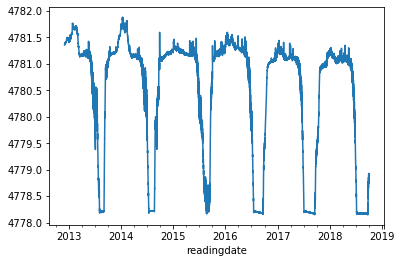

In [13]:
%matplotlib inline
dfs['P1014'] = dfs['P1014'][(dfs['P1014'].index > pd.to_datetime('2012-12-01 00:00:00'))&(dfs['P1014'].index < pd.to_datetime('2018-10-01 00:00:00'))]

dfs['P1014']['waterelevation'].plot()

In [14]:
df = pd.concat(dfs).reset_index().drop(['level_0'],axis=1)
df.to_pickle(savefold+"raw_hydrograph_data.pickle")

# Read Saved Well Data

In [15]:
df = pd.read_pickle(savefold+"raw_hydrograph_data.pickle")
well_table = pd.read_pickle(savefold+"well_table.pickle")
well_table['top_elev'] = well_table['verticalmeasure'] + well_table['stickup']

# Raw Water Level Charts

In [16]:
%matplotlib inline
rcParams['figure.figsize'] = 16, 9
rcParams['pdf.fonttype'] = 42
rcParams['font.size'] = 14

piez = {}

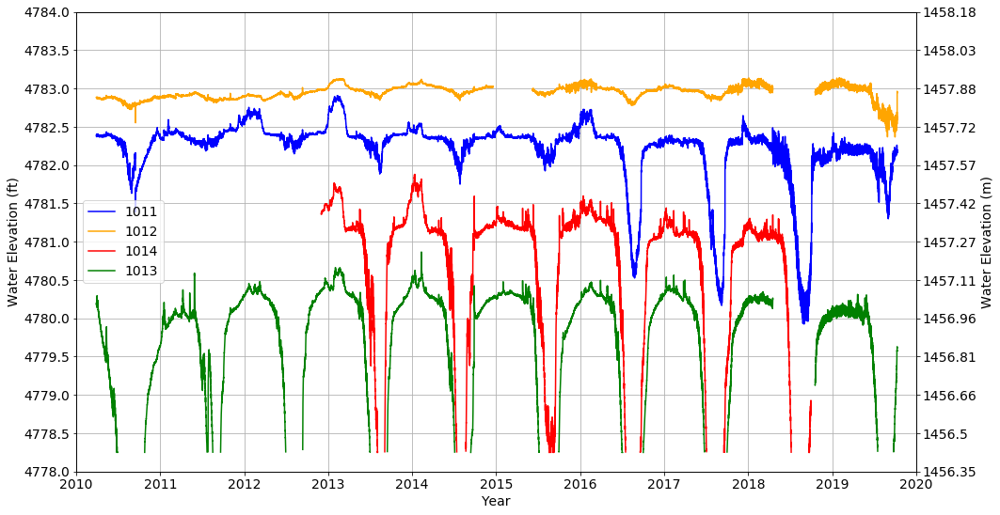

In [77]:
fig, ax = plt.subplots(1,1)
main_cols = ['blue','orange','red','green']
light_cols = ['cyan','wheat','pink','seagreen']
wells = [1011,1012,1014,1013]
i=0
for well in wells:
    colr = main_cols[i]
    lcolr = light_cols[i]
    i += 1
    piez[well] = df[df['locationid']==well][['temperature','waterelevation',
                                             'readingdate','driftcorrection']].set_index(['readingdate'])
    piez[well] = piez[well].resample('1H').asfreq()
    if well == 1014:
        piez[well] = piez[well][(piez[well].index > pd.to_datetime('2012-11-15'))&(piez[well].index<pd.to_datetime('2018-10-1'))]
    if well in [1014,1013]:
        piez[well].loc[piez[well]['waterelevation']<4778.25,'waterelevation'] = None
    piez[well].loc[piez[well]['temperature']<=0.0,'waterelevation'] = None
    stickup = well_table.loc[well,'verticalmeasure']+well_table.loc[well,'stickup']
    wellev = well_table.loc[well,'verticalmeasure']
    ax.plot(piez[well].index.values, piez[well]['waterelevation'],label=f"{well}",color=colr)
    #ax.hlines(y=wellev,xmin='2010-1-1',xmax='2020-1-1',linestyles='--',label=f'Elev. at {well}',color=lcolr)
    piez[well] = piez[well].rename(columns={'waterelevation':f'{well}_wle',
                                            'temperature':f'{well}_t'}).drop(['driftcorrection'],axis=1)

ymin = 4778
ymax = 4784
yint = 0.5
ax.grid(True)
ax.legend(loc=6)
ax.set_ylim(ymin,ymax)
ax2 = ax.twinx()
meter_ticks = np.arange(ymin/3.2808,(ymax+yint)/3.2808,yint/3.2808)
ax.set_yticks(np.arange(ymin,ymax+yint,yint))
ax2.set_yticks(meter_ticks)
ax2.set_ylim(ymin/3.2808,ymax/3.2808)
ax2.set_yticklabels([round(i,2) for i in meter_ticks])
ax.set_xlim('2010-1-1','2020-1-1')
ax.set_ylabel('Water Elevation (ft)')
ax2.set_ylabel('Water Elevation (m)')
ax.set_xlabel('Year')
for tp in ['svg','png','pdf']:
    fig.savefig(figfold+f"hydrographs_{wells[0]}-{wells[-1]}.{tp}")

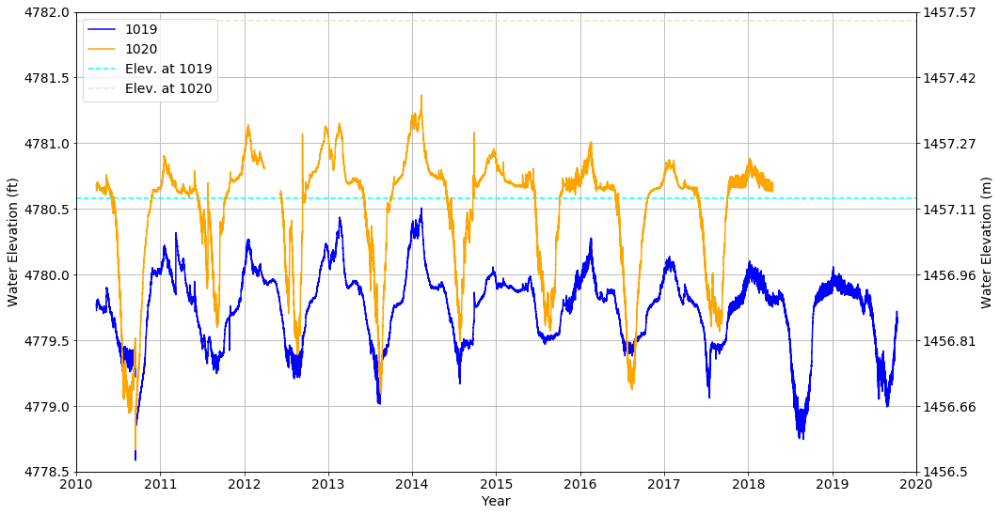

In [69]:
fig, ax = plt.subplots(1,1)
main_cols = ['blue','orange','red','green']
light_cols = ['cyan','wheat','pink','seagreen']
wells = [1019,1020]

i=0
for well in wells:
    colr = main_cols[i]
    lcolr = light_cols[i]
    i += 1
    piez[well] = df[df['locationid']==well][['temperature','waterelevation',
                                             'readingdate','driftcorrection']].set_index(['readingdate'])
    piez[well] = piez[well].resample('1H').asfreq()
    piez[well].loc[piez[well]['temperature']<=0.0,'waterelevation'] = None
    stickup = well_table.loc[well,'verticalmeasure']+well_table.loc[well,'stickup']
    wellev = well_table.loc[well,'verticalmeasure']
    ax.plot(piez[well].index.values, piez[well]['waterelevation'],label=f"{well}",color=colr)
    #ax.hlines(y=wellev,xmin='2010-1-1',xmax='2020-1-1',linestyles='--',label=f'Elev. at {well}',color=lcolr)
    piez[well] = piez[well].rename(columns={'waterelevation':f'{well}_wle',
                                            'temperature':f'{well}_t'}).drop(['driftcorrection'],axis=1)

ymin = 4778.5
ymax = 4782.0
yint = 0.5
    
ax.grid(True)
ax.legend(loc=2)
ax.set_ylim(ymin,ymax)
ax2 = ax.twinx()
meter_ticks = np.arange(ymin/3.2808,(ymax+yint)/3.2808,yint/3.2808)
ax.set_yticks(np.arange(ymin,ymax+yint,yint))
ax2.set_yticks(meter_ticks)
ax2.set_ylim(ymin/3.2808,ymax/3.2808)
ax2.set_yticklabels([round(i,2) for i in meter_ticks])
ax.set_xlim('2010-1-1','2020-1-1')
ax.set_ylabel('Water Elevation (ft)')
ax2.set_ylabel('Water Elevation (m)')
ax.set_xlabel('Year')

for tp in ['svg','png','pdf']:
    fig.savefig(figfold+f"hydrographs{wells[0]}-{wells[-1]}.{tp}")


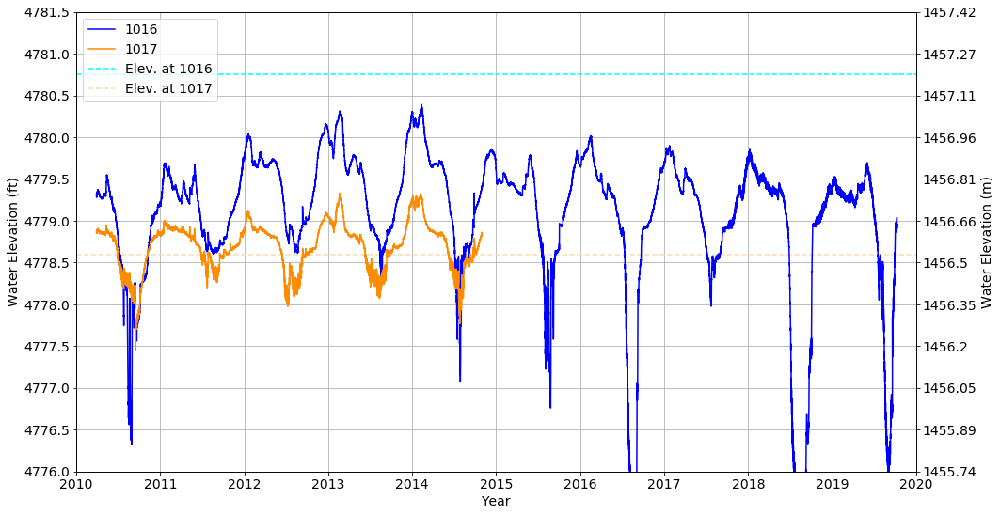

In [70]:
fig, ax = plt.subplots(1,1)

main_cols = ['blue','darkorange','red','green']
light_cols = ['cyan','wheat','pink','seagreen']
i = 0
wells = [1016,1017]
for well in wells:
    colr = main_cols[i]
    lcolr = light_cols[i]
    i += 1
    piez[well] = df[df['locationid']==well][['temperature','waterelevation',
                                             'readingdate','driftcorrection']].set_index(['readingdate'])
    piez[well] = piez[well].resample('1H').asfreq()
    if well in [1016]:
        piez[well].loc[piez[well]['waterelevation']<4776,'waterelevation'] = None
    piez[well].loc[piez[well]['temperature']<=0.0,'waterelevation'] = None
    
    stickup = well_table.loc[well,'verticalmeasure']+well_table.loc[well,'stickup']
    wellev = well_table.loc[well,'verticalmeasure']
    ax.plot(piez[well].index.values, piez[well]['waterelevation'],label=f"{well}",color=colr)
    ax.hlines(y=wellev,xmin='2010-1-1',xmax='2020-1-1',linestyles='--',label=f'Elev. at {well}',color=lcolr)
    piez[well] = piez[well].rename(columns={'waterelevation':f'{well}_wle',
                                            'temperature':f'{well}_t'}).drop(['driftcorrection'],axis=1)

ymin = 4776
ymax = 4781.5
yint = 0.5

ax.grid(True)
ax.legend(loc=2)
ax.set_ylim(ymin,ymax)
ax2 = ax.twinx()
meter_ticks = np.arange(ymin/3.2808,(ymax+yint)/3.2808,yint/3.2808)
ax.set_yticks(np.arange(ymin,ymax+yint,yint))
ax2.set_yticks(meter_ticks)
ax2.set_ylim(ymin/3.2808,ymax/3.2808)
ax2.set_yticklabels([round(i,2) for i in meter_ticks])
ax.set_xlim('2010-1-1','2020-1-1')
ax.set_ylabel('Water Elevation (ft)')
ax2.set_ylabel('Water Elevation (m)')
ax.set_xlabel('Year')    

for tp in ['svg','png','pdf']:
    fig.savefig(figfold+f"hydrographs{wells[0]}-{wells[-1]}.{tp}")




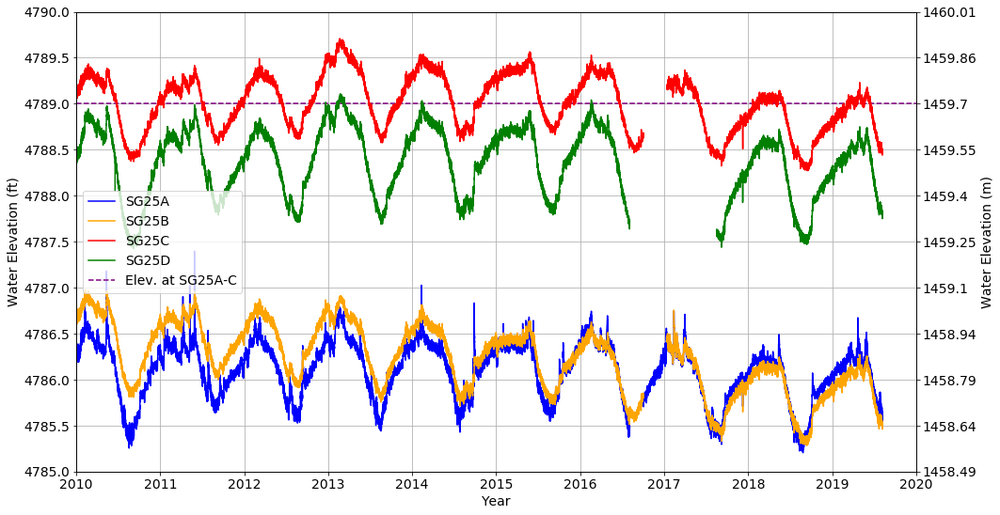

In [76]:
fig, ax = plt.subplots(1,1)
main_cols = ['blue','orange','red','green']
light_cols = ['cyan','wheat','pink','seagreen']
wells = [61,62,63,64]
welllab = {61:'SG25A',62:'SG25B',63:'SG25C',64:'SG25D'}
i=0
for well in wells:
    colr = main_cols[i]
    lcolr = light_cols[i]
    i += 1
    piez[well] = df[df['locationid']==well][['waterelevation','temperature',
                                                       'readingdate',
                                                       'driftcorrection']].set_index(['readingdate'])
    piez[well] = piez[well].sort_index()
    piez[well] = piez[well].resample('1H').asfreq()
    wellname = well_table.loc[well,'locationname']

    ax.plot(piez[well].index.values, piez[well]['waterelevation'],label=f"{welllab[well]}",color=colr)
    
    piez[well] = piez[well].rename(columns={'waterelevation':f'{wellname}_wle',
                                            'temperature':f'{wellname}_t'}).drop(['driftcorrection'],axis=1) 

ymin = 4785
ymax = 4790
yint = 0.5
stickup = well_table.loc[61,'verticalmeasure']+well_table.loc[61,'stickup']
wellev = well_table.loc[61,'verticalmeasure']
ax.hlines(y=wellev,xmin='2010-1-1',xmax='2020-1-1',linestyles='--',label=f'Elev. at SG25A-C',color='purple')
ax.grid(True)
ax.legend(loc=6)
ax.set_ylim(ymin,ymax)
ax2 = ax.twinx()
meter_ticks = np.arange(ymin/3.2808,(ymax+yint)/3.2808,yint/3.2808)
ax.set_yticks(np.arange(ymin,ymax+yint,yint))
ax2.set_yticks(meter_ticks)
ax2.set_ylim(ymin/3.2808,ymax/3.2808)
ax2.set_yticklabels([round(i,2) for i in meter_ticks])
ax.set_xlim('2010-1-1','2020-1-1')
ax.set_ylabel('Water Elevation (ft)')
ax2.set_ylabel('Water Elevation (m)')
ax.set_xlabel('Year')  

for tp in ['svg','png','pdf']:
    fig.savefig(figfold+f"hydrographs{wells[0]}-{wells[-1]}.{tp}")

In [30]:
dfpiv = pd.concat(piez,axis=1)
dfpiv.columns = dfpiv.columns.droplevel(0)
dfpiv=dfpiv[dfpiv.index>='2010-01-01']
dfpiv.to_pickle(savefold+"pivotedwells.pickle")

In [31]:
dfpiv.columns

Index(['SG25A_wle', 'SG25A_t', 'SG25B_wle', 'SG25B_t', 'SG25C_wle', 'SG25C_t',
       'SG25D_wle', 'SG25D_t', '1011_t', '1011_wle', '1012_t', '1012_wle',
       '1013_t', '1013_wle', '1014_t', '1014_wle', '1016_t', '1016_wle',
       '1017_t', '1017_wle', '1019_t', '1019_wle', '1020_t', '1020_wle'],
      dtype='object')

# Raw Temperature Plots

C:\Users\paulinkenbrandt\AppData\Local\Continuum\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:18: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.

C:\Users\paulinkenbrandt\AppData\Local\Continuum\anaconda3\envs\py37\lib\site-packages\IPython\core\pylabtools.py:128: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



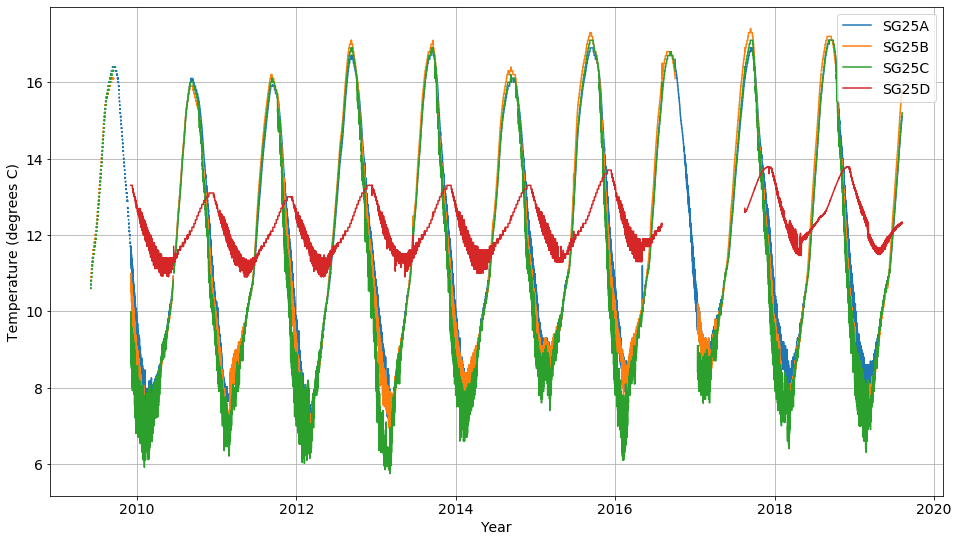

In [133]:
piez = {}

wells = [61,62,63,64]
for well in wells:
    piez[well] = df[df['locationid']==well][['temperature','waterelevation',
                                             'readingdate','driftcorrection']].set_index(['readingdate'])
    piez[well] = piez[well][(piez[well]['temperature']<17.5)&(piez[well]['temperature']>4)]
    piez[well] = piez[well].resample('1H').asfreq()

    #piez[well].loc[piez[well]['temperature']<=0.0,'waterelevation'] = None
    plt.plot(piez[well].index.values, piez[well]['temperature'],label=well_table.loc[well,'locationname'])
plt.grid()
plt.legend()
#plt.yticks(np.arange(4778,4784,0.5))
plt.ylabel('Temperature (degrees C)')
plt.xlabel('Year')
for tp in ['svg','png','pdf']:
    plt.savefig(figfold+f"hydrographs{wells[0]}-{wells[-1]}.{tp}")

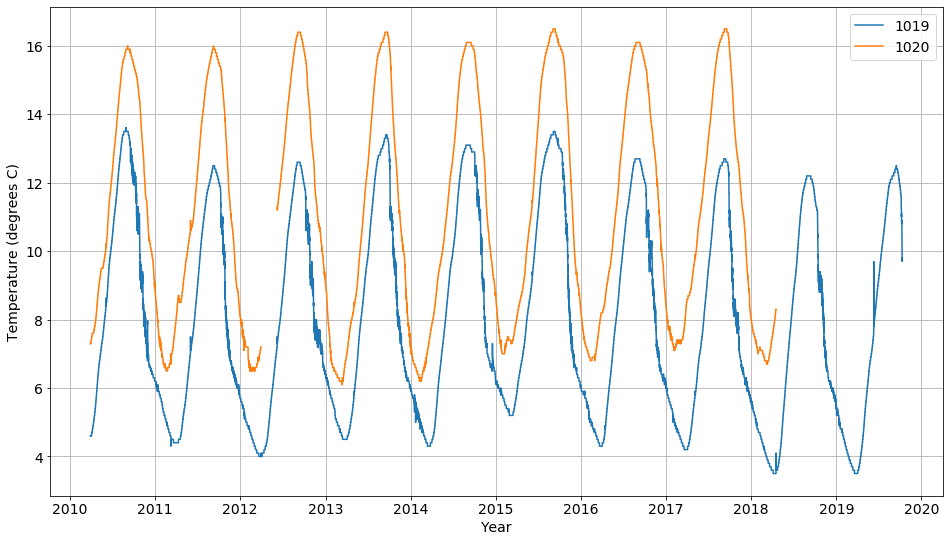

In [27]:
wells = [1019,1020]
for well in wells:
    piez[well] = df[df['locationid']==well][['temperature','waterelevation',
                                             'readingdate','driftcorrection']].set_index(['readingdate'])
    piez[well] = piez[well].resample('1H').asfreq()
    piez[well].loc[piez[well]['temperature']>20,'temperature'] = None
    piez[well].loc[piez[well]['temperature']<=0.0,'waterelevation'] = None
    plt.plot(piez[well].index.values, piez[well]['temperature'],label=well)
plt.grid()
plt.legend()
#plt.yticks(np.arange(4776,4781,0.5))
plt.ylabel('Temperature (degrees C)')
plt.xlabel('Year')
for tp in ['svg','png','pdf']:
    plt.savefig(figfold+f"temperature{wells[0]}-{wells[-1]}.{tp}")

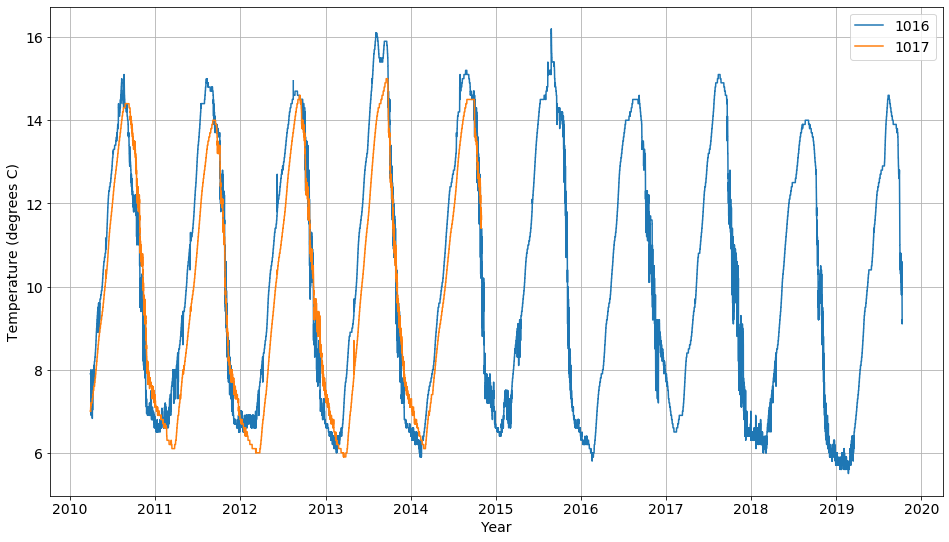

In [28]:
wells = [1016,1017]
for well in wells:
    piez[well] = df[df['locationid']==well][['temperature','waterelevation',
                                             'readingdate','driftcorrection']].set_index(['readingdate'])
    piez[well] = piez[well].resample('1H').asfreq()
    piez[well].loc[piez[well]['temperature']>20,'temperature'] = None
    piez[well].loc[piez[well]['temperature']<=0.0,'waterelevation'] = None
    plt.plot(piez[well].index.values, piez[well]['temperature'],label=well)
plt.grid()
plt.legend()
#plt.yticks(np.arange(4776,4781,0.5))
plt.ylabel('Temperature (degrees C)')
plt.xlabel('Year')
for tp in ['svg','png','pdf']:
    plt.savefig(figfold+f"temperature{wells[0]}-{wells[-1]}.{tp}")

C:\Users\paulinkenbrandt\AppData\Local\Continuum\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:19: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.

C:\Users\paulinkenbrandt\AppData\Local\Continuum\anaconda3\envs\py37\lib\site-packages\IPython\core\pylabtools.py:128: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



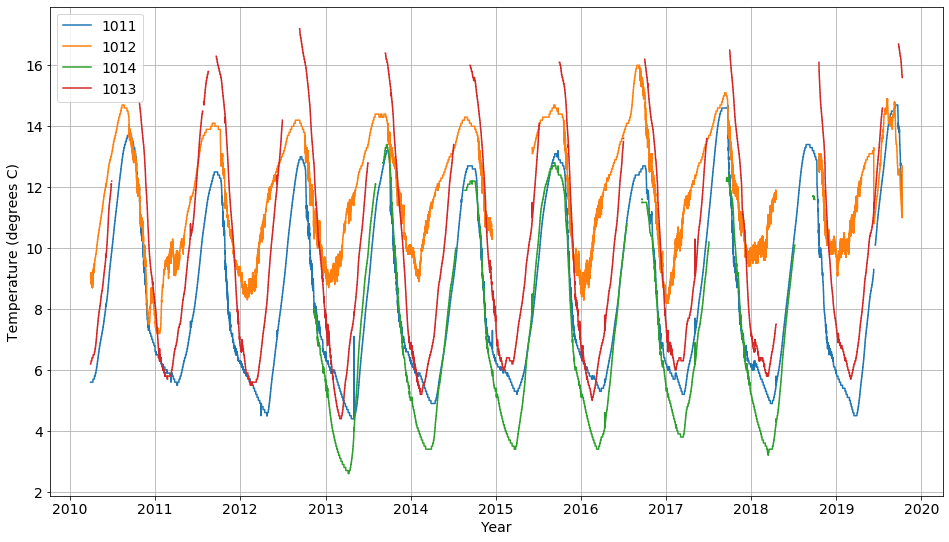

In [29]:
wells = [1011,1012,1014,1013]
for well in wells:
    piez[well] = df[df['locationid']==well][['temperature','waterelevation',
                                             'readingdate','driftcorrection']].set_index(['readingdate'])
    piez[well] = piez[well].resample('1H').asfreq()
    piez[well].loc[piez[well]['temperature']>20,'temperature'] = None
    piez[well].loc[piez[well]['temperature']<=0.0,'waterelevation'] = None
    if well == 1014:
        piez[well] = piez[well][(piez[well].index > pd.to_datetime('2012-11-15'))&(piez[well].index<pd.to_datetime('2018-10-1'))]
    if well in [1014,1013]:
        piez[well].loc[piez[well]['waterelevation']<4778.25,'temperature'] = None
    plt.plot(piez[well].index.values, piez[well]['temperature'],label=well)
plt.grid()
plt.legend()
#plt.yticks(np.arange(4776,4781,0.5))
plt.ylabel('Temperature (degrees C)')
plt.xlabel('Year')
for tp in ['svg','png','pdf']:
    plt.savefig(figfold+f"temperature{wells[0]}-{wells[-1]}.{tp}")

In [ ]:
ax[1].hlines(well_elev, subset.first_valid_index(),subset.last_valid_index(),
             linestyles='dashed',color='green',label='surface')
ax[1].hlines(well_elev+stickup, subset.first_valid_index(),subset.last_valid_index(),
             linestyles='dotted',color='purple',label='well top')

In [42]:
well_table = ll.pull_well_table(engine,loc_table='ugs_ngwmn_monitoring_locations')
well_table.to_pickle(savefold+"well_table.pickle")

# Plot Water Year

In [10]:
df = pd.read_pickle(savefold+"raw_hydrograph_data.pickle")
well_table = pd.read_pickle(savefold+"well_table.pickle")
well_table['top_elev'] = well_table['verticalmeasure'] + well_table['stickup']
dfpiv = pd.read_pickle(savefold+"pivotedwells.pickle")

In [12]:
dfwy = calc_wat_year(dfpiv)

In [15]:
dfwy.columns

Index(['SG25A_wle', 'SG25A_t', 'SG25B_wle', 'SG25B_t', 'SG25C_wle', 'SG25C_t',
       'SG25D_wle', 'SG25D_t', '1011_t', '1011_wle', '1012_t', '1012_wle',
       '1013_t', '1013_wle', '1014_t', '1014_wle', '1016_t', '1016_wle',
       '1017_t', '1017_wle', '1019_t', '1019_wle', '1020_t', '1020_wle',
       'month', 'year', 'doy', 'water year', 'ones', 'water year doy',
       'doylen', 'water year doy1'],
      dtype='object')

(0, 365)

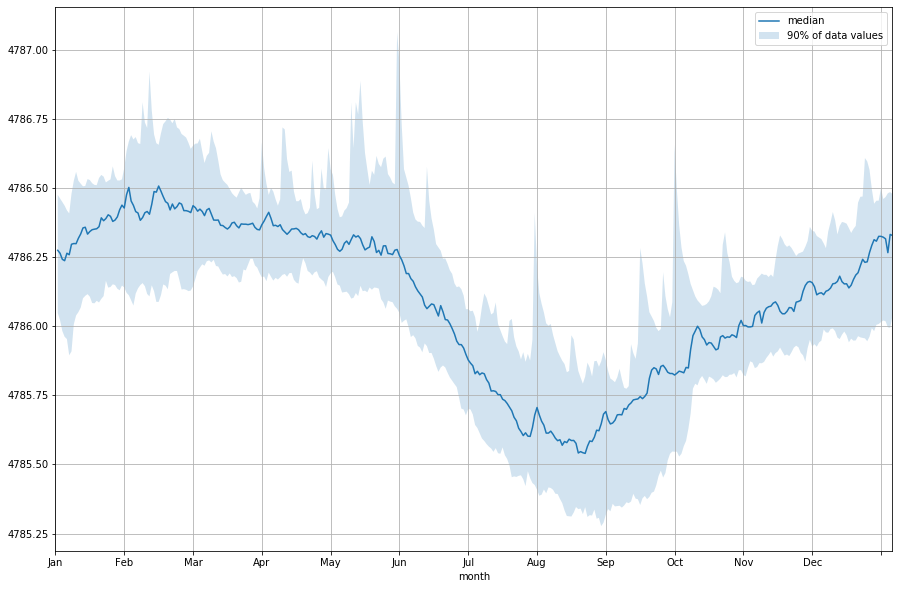

In [18]:
val = 'SG25A_wle'
grpd = dfwy.groupby(['doy'])[val]
xm = grpd.median().index
ym = grpd.median()
ya = grpd.mean()
y1 = grpd.quantile(q=0.05)
y2 = grpd.quantile(q=0.95)

plt.figure()
plt.plot(xm,ym, label='median')
plt.fill_between(xm,y1,y2, label='90% of data values', alpha=0.2, linewidth=0)
plt.legend()
plt.grid()

plt.xlabel('month')
dtrng = pd.date_range('1/1/2014','12/31/2014',freq='1M')
datelabels = [d.strftime('%b') for d in dtrng]
plt.xticks(range(0,365,30), datelabels)#dtrng)#,rotation=90)
plt.xlim(0,365)

In [71]:
dfwy.columns

Index(['SG25A_wle', 'SG25A_t', 'SG25B_wle', 'SG25B_t', 'SG25C_wle', 'SG25C_t',
       'SG25D_wle', 'SG25D_t', '1011_t', '1011_wle', '1012_t', '1012_wle',
       '1013_t', '1013_wle', '1014_t', '1014_wle', '1016_t', '1016_wle',
       '1017_t', '1017_wle', '1019_t', '1019_wle', '1020_t', '1020_wle',
       'month', 'year', 'doy', 'water year', 'ones', 'water year doy',
       'doylen', 'water year doy1'],
      dtype='object')

In [74]:
df = dfwy.copy()
#df[val] = df[val].apply(lambda x: x - df[val].mean(),1)


monthpi = np.arange(0,2*np.pi,(2*np.pi)/12)
dtrng = pd.date_range('1/1/2014','12/31/2014',freq='1MS')
datelabels = [d.strftime('%b') for d in dtrng]
monthpi = dict(zip(datelabels,np.linspace(0,2*np.pi,12)))

minval = df[val].min()
if minval < 0:
    df[val] = df[val] + ceil(abs(minval))


modf = df.groupby(df.index.month).mean()[val]

In [87]:
modf.index

Index([2010-01-31 00:00:00, 2010-02-28 00:00:00, 2010-03-31 00:00:00,
       2010-04-30 00:00:00, 2010-05-31 00:00:00, 2010-06-30 00:00:00,
       2010-07-31 00:00:00, 2010-08-31 00:00:00, 2010-09-30 00:00:00,
       2010-10-31 00:00:00,
       ...
       2019-02-28 00:00:00, 2019-03-31 00:00:00, 2019-04-30 00:00:00,
       2019-05-31 00:00:00, 2019-06-30 00:00:00, 2019-07-31 00:00:00,
       2019-08-31 00:00:00, 2019-09-30 00:00:00, 2019-10-31 00:00:00,
                    'year'],
      dtype='object', name='readingdate', length=119)

# Circle Graphs

https://www.dataquest.io/blog/climate-temperature-spirals-python/

In [150]:
def plot_circtime(dfwy,val,climvar='Temperature',tickint = 2, offset=True):

    df = dfwy.copy()
    #df[val] = df[val].apply(lambda x: x - df[val].mean(),1)

    dtrng = pd.date_range('1/1/2014','12/31/2014',freq='1MS')
    datelabels = [int(d.strftime('%m')) for d in dtrng]
    monthpi = dict(zip(datelabels,np.linspace(0,2*np.pi,13)))

    df['year'] = df.index.year
    df['month'] = df.index.month
    #df[val] = df[val].mean() - df[val]

    modf = df.groupby(['year','month']).mean()[val]           

    minval = modf.min()
    maxval = modf.max()
    
    if offset:
        modf = modf + 10

    fig = plt.figure(figsize=(14,14))
    ax1 = plt.subplot(111, projection='polar')

    ax1.set_xticks(np.linspace(0,2*np.pi,13))
    ax1.set_xticklabels([d.strftime('%b') for d in dtrng])
    #ax1.set_yticklabels([])
    #fig.set_facecolor("#323331")
    
    plotymin = modf.min()-1
    plotymax = modf.max()
    yticks = np.arange(plotymin,plotymax+tickint,tickint)
    
    if offset:
        ylabs = [round(i,1) for i in np.arange(plotymin-10,plotymax-10+tickint,tickint)]
    else:
        ylabs = [round(i,1) for i in np.arange(plotymin,plotymax+tickint,tickint)]

    ax1.set_ylim(plotymin, plotymax)
    ax1.set_yticks(yticks)
    ax1.set_yticklabels(ylabs)
    ax1.set_title(f"{climvar} at {val.split('_')[0]}", fontdict={'fontsize': 20})
    #ax1.set_axis_bgcolor('#000100')

    color=iter(plt.cm.viridis(np.linspace(0,1,len(dfwy.index.year.unique()))))
    for year in modf.index.get_level_values(0).unique():
        clr=next(color)
        yrmodf = modf.loc[(year,1):(year+1,1)]
        r = yrmodf.values
        theta = [monthpi[i] for i in yrmodf.index.get_level_values(1)]
        ax1.plot(theta, r, color=clr,label=year)

    plt.legend()
    return fig, ax1


In [175]:
def plot_circday(dfwy,val,climvar='Temperature',tickint = 2, offset=True):

    df = dfwy.copy()
    #df[val] = df[val].apply(lambda x: x - df[val].mean(),1)
    df = df.resample('1D').mean().interpolate(method='time')


    df['year'] = df.index.year
    df['month'] = df.index.month
    #df[val] = df[val].mean() - df[val]

    #modf = df.groupby(['year','month']).mean()[val]           
    modf = df
    minval = modf.min()
    maxval = modf.max()
    
    if offset:
        modf = modf + 10

    fig = plt.figure(figsize=(14,14))
    ax1 = plt.subplot(111, projection='polar')

    morng = pd.date_range('1/1/2014','12/31/2014',freq='1MS')
    ax1.set_xticks(np.linspace(0,2*np.pi,13))
    ax1.set_xticklabels([d.strftime('%b') for d in morng])
    #ax1.set_yticklabels([])
    #fig.set_facecolor("#323331")
    
    plotymin = modf[val].min()-1
    plotymax = modf[val].max()

    yticks = np.arange(plotymin,plotymax+tickint,tickint)
    
    if offset:
        ylabs = [round(i,1) for i in np.arange(plotymin-10,plotymax-10+tickint,tickint)]
    else:
        ylabs = [round(i,1) for i in np.arange(plotymin,plotymax+tickint,tickint)]

    ax1.set_ylim(plotymin, plotymax)
    ax1.set_yticks(yticks)
    ax1.set_yticklabels(ylabs)
    ax1.set_title(f"{climvar} at {val.split('_')[0]}", fontdict={'fontsize': 20})
    #ax1.set_axis_bgcolor('#000100')

    color=iter(plt.cm.viridis(np.linspace(0,1,len(dfwy.index.year.unique()))))
    for year in modf.index.year.unique():
        clr=next(color)
        begdate = pd.to_datetime(f"{year}-01-01")
        enddate = pd.to_datetime(f"{year+1}-01-01")
        yrmodf = modf.loc[begdate:enddate,val]
        dtrng = pd.date_range(begdate,enddate,freq='1D')
        datelabels = [int(d.strftime('%j')) for d in dtrng]
        monthpi = dict(zip(datelabels,np.linspace(0,2*np.pi,len(datelabels)+1)))
        r = yrmodf.values
        theta = [monthpi[i] for i in yrmodf.index.dayofyear]
        ax1.plot(theta, r, color=clr,label=year)

    plt.legend()
    return fig, ax1


15.185416666666669


(<Figure size 1008x1008 with 1 Axes>,
 <matplotlib.axes._subplots.PolarAxesSubplot at 0x1ceb485d828>)

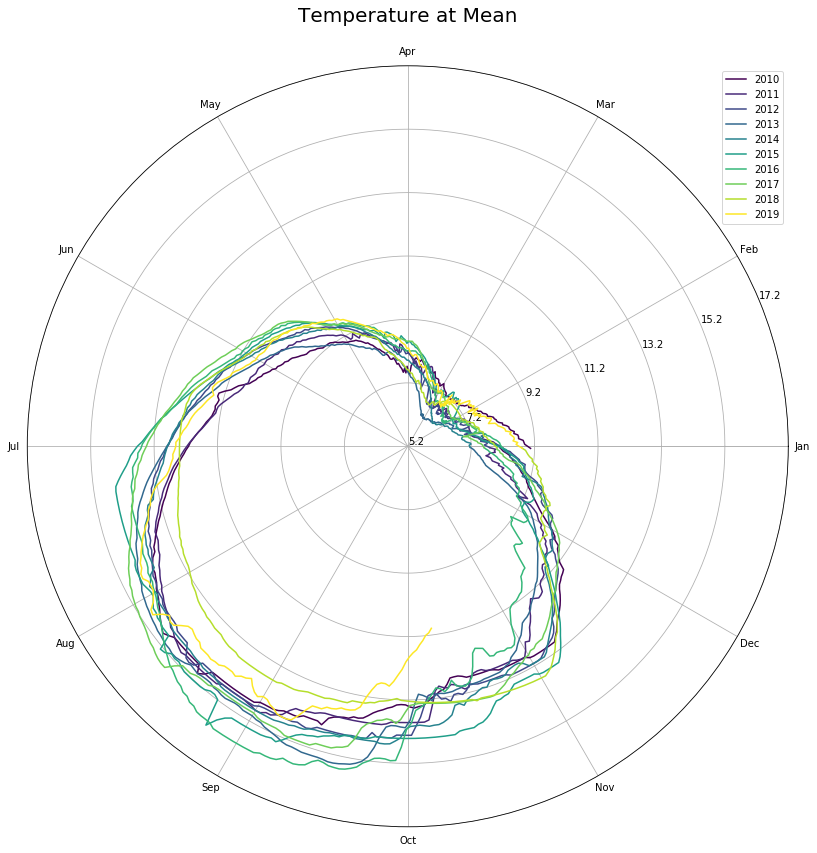

In [173]:
plot_circday(dfall,'Mean_temp_c')

In [ ]:
tempcols = []
for col in dfwy.columns:
    if '_t' in col:
        tempcols.append(col)
        plot_circtime(dfwy,col)

(<Figure size 1008x1008 with 1 Axes>,
 <matplotlib.axes._subplots.PolarAxesSubplot at 0x1ceb024f5c0>)

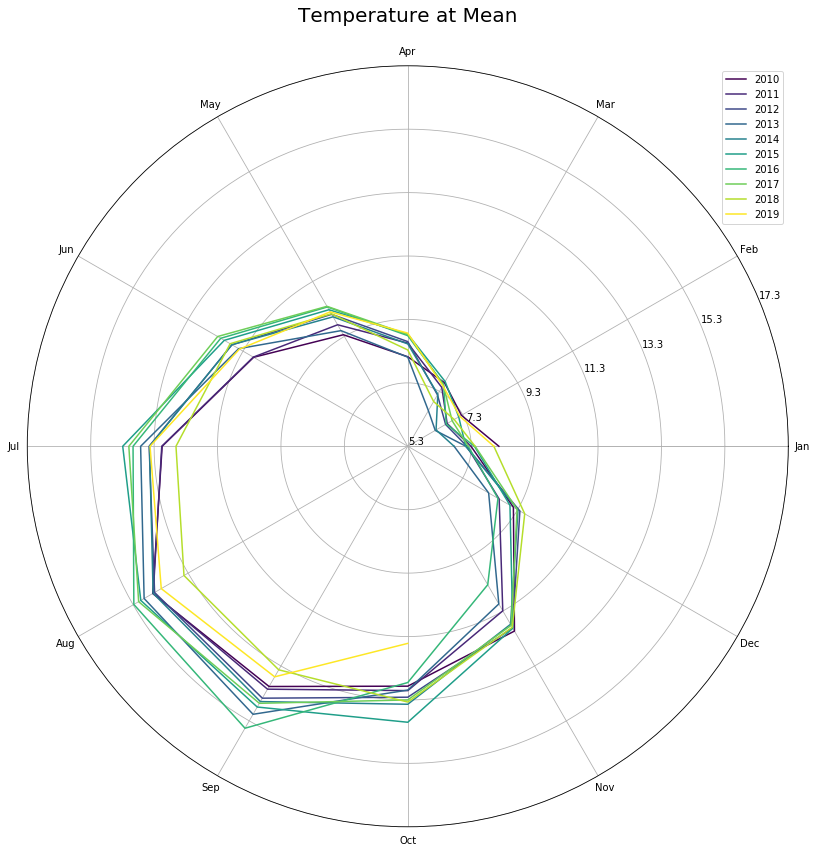

In [147]:
dfall = dfwy[tempcols].median(axis=1).to_frame().rename(columns={0:'Mean_temp_c'})
plot_circtime(dfall,'Mean_temp_c')

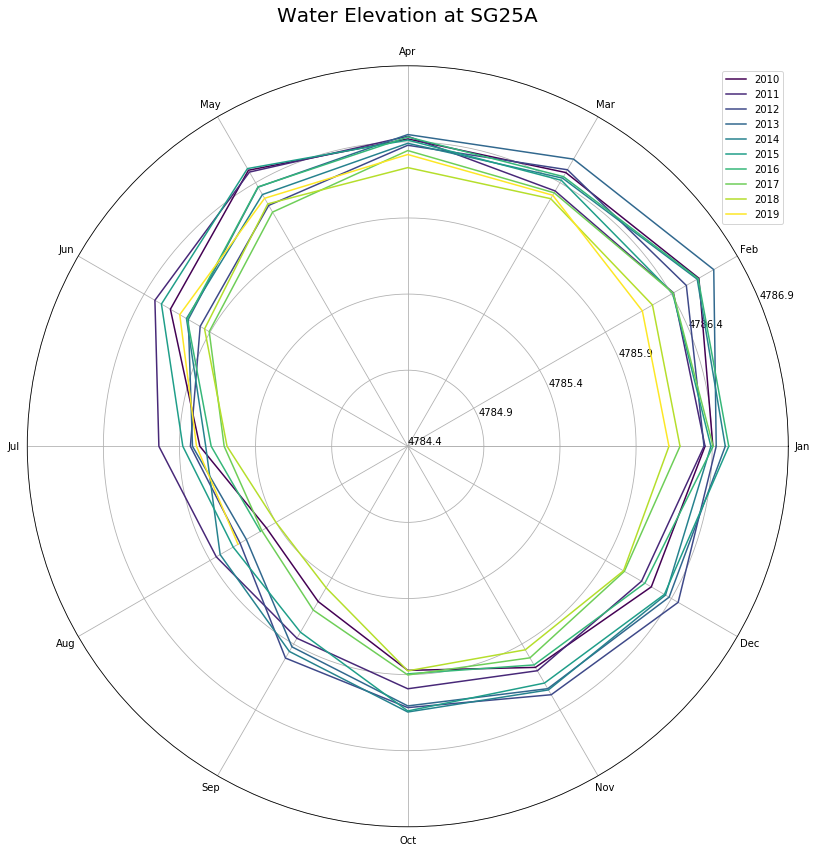

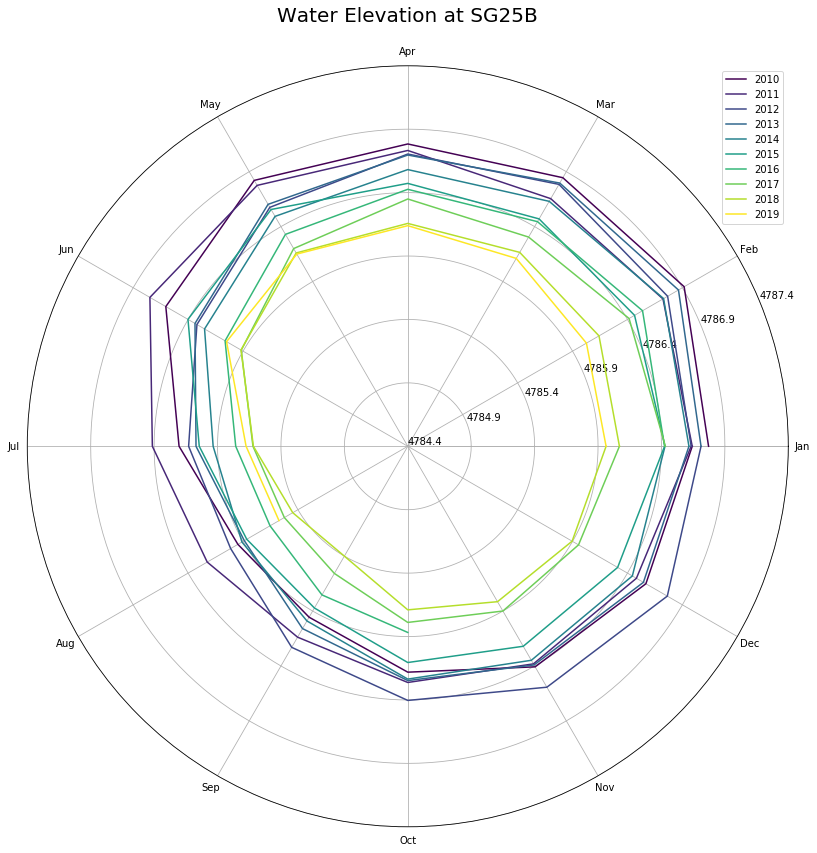

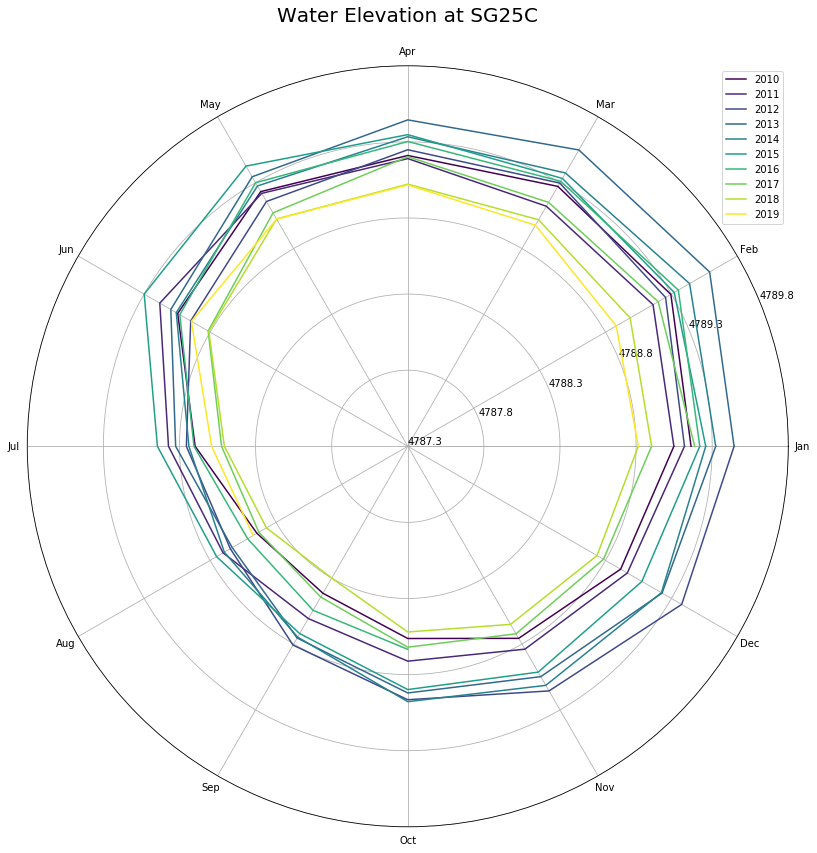

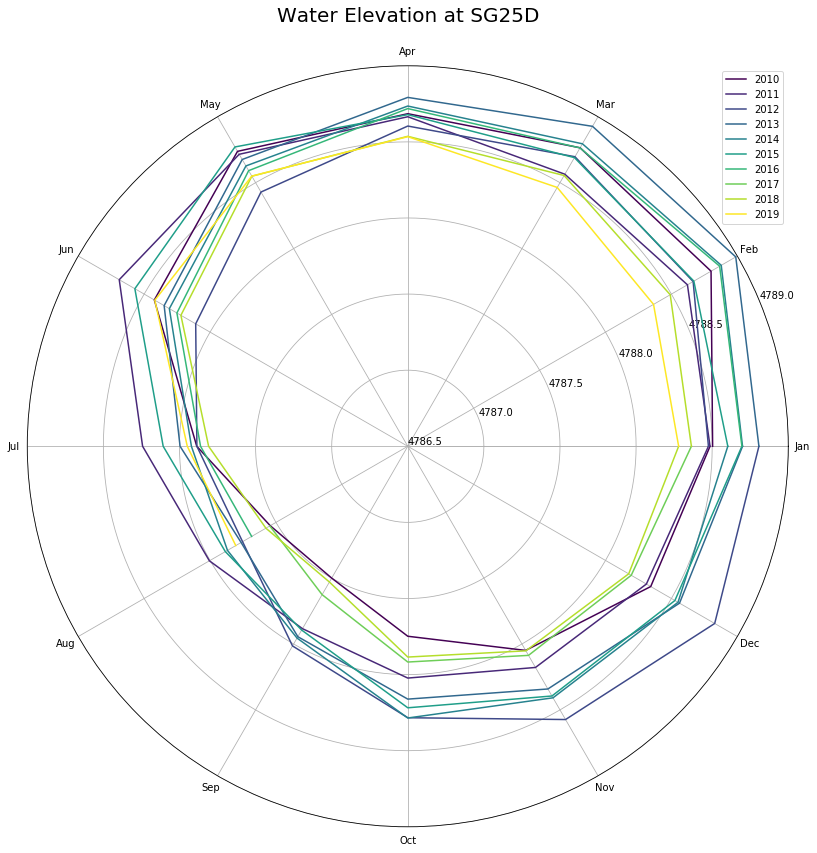

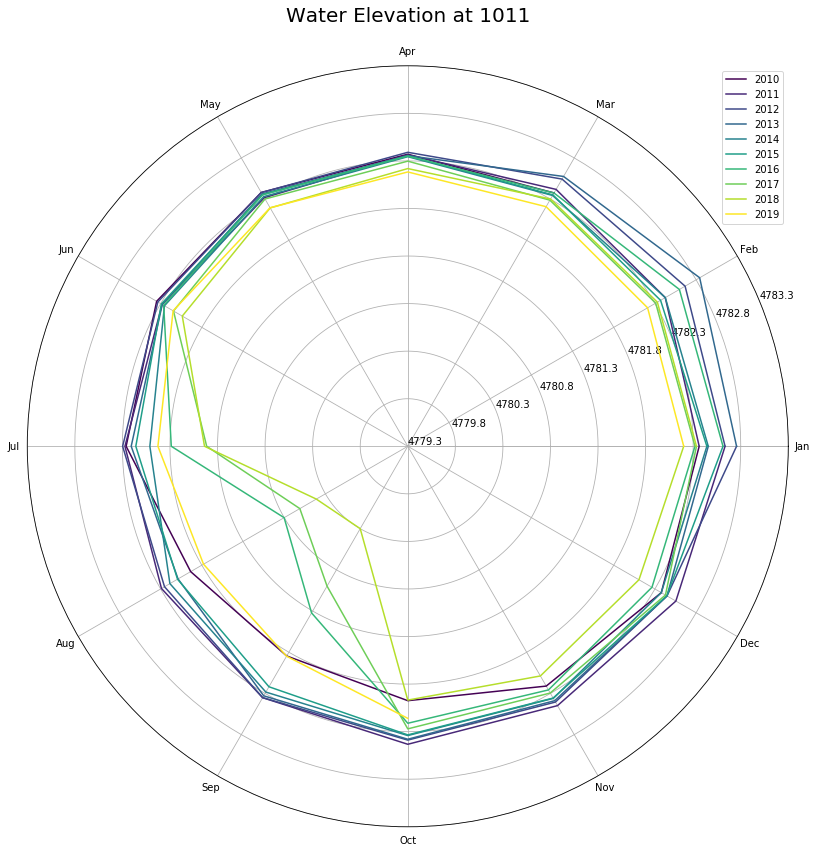

...

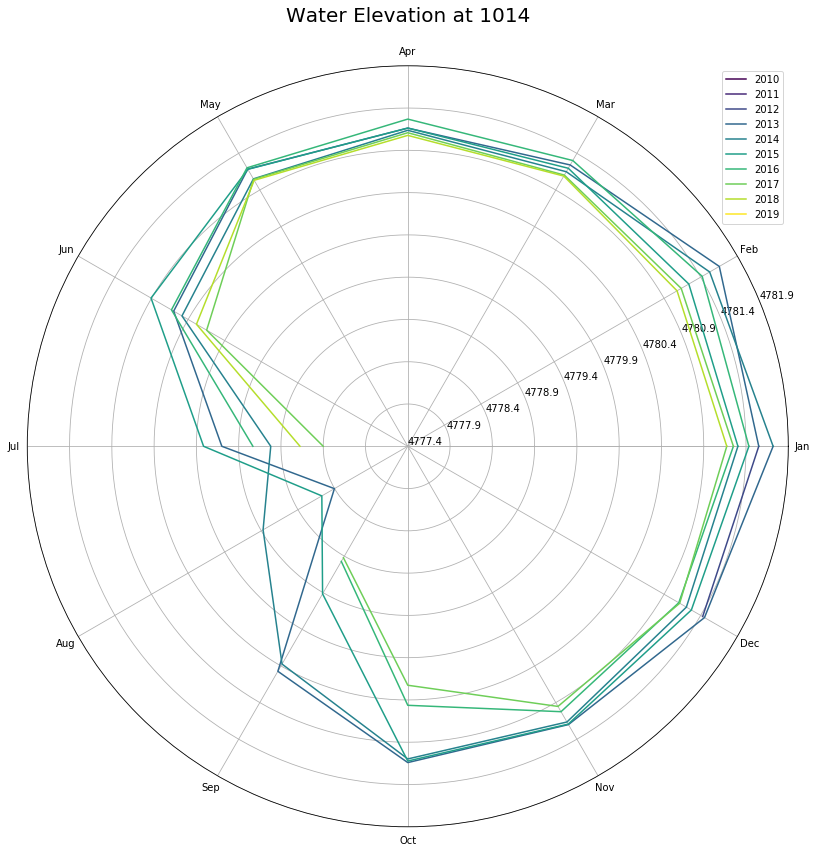

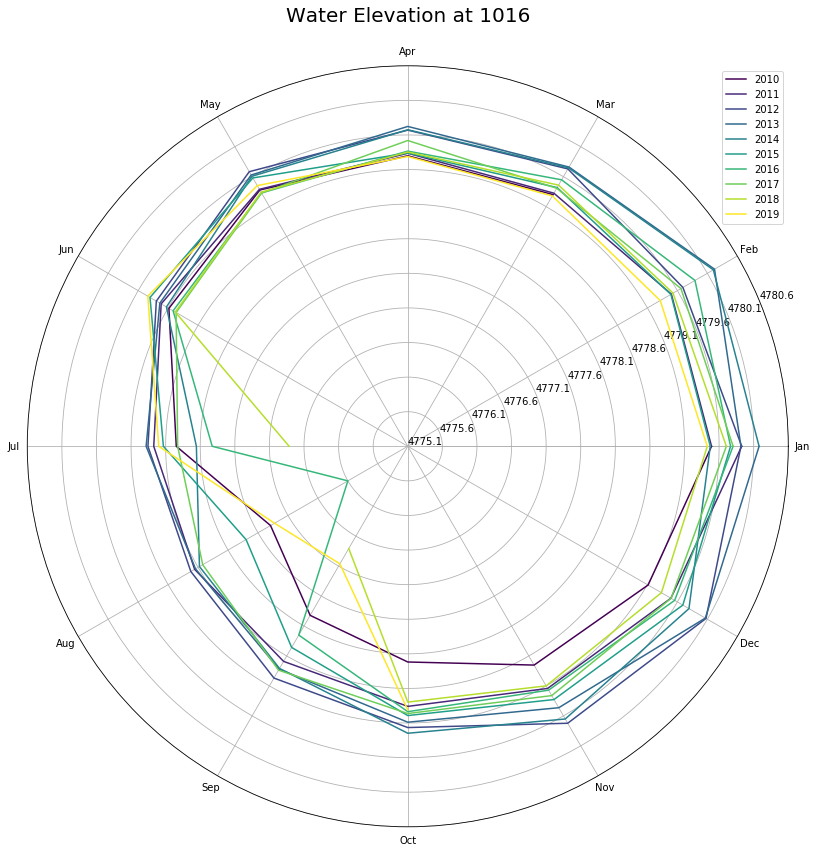

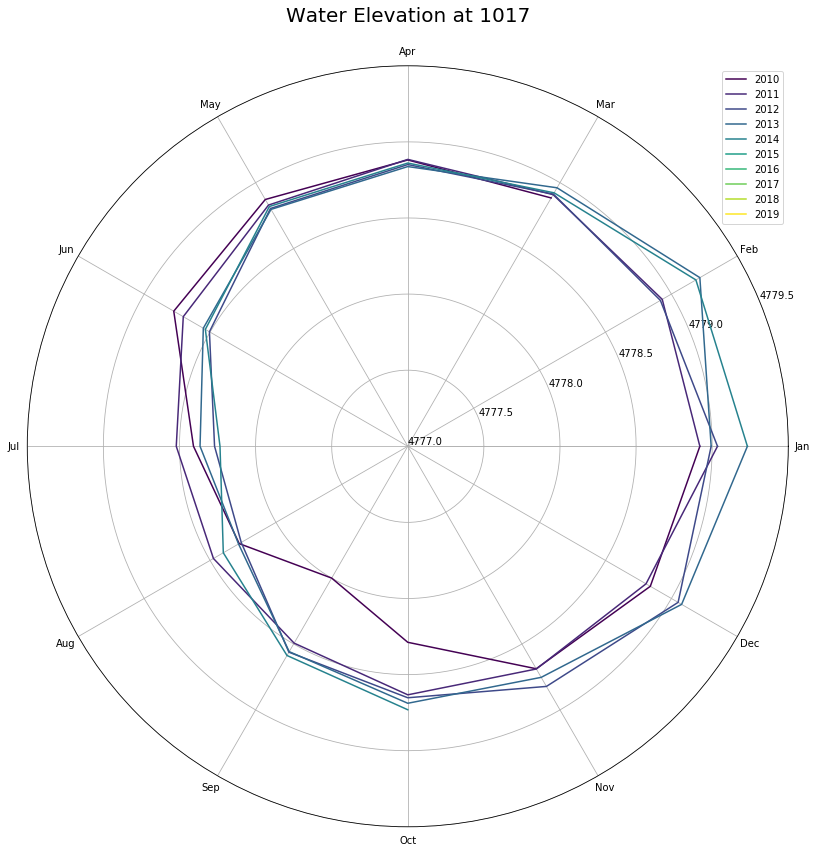

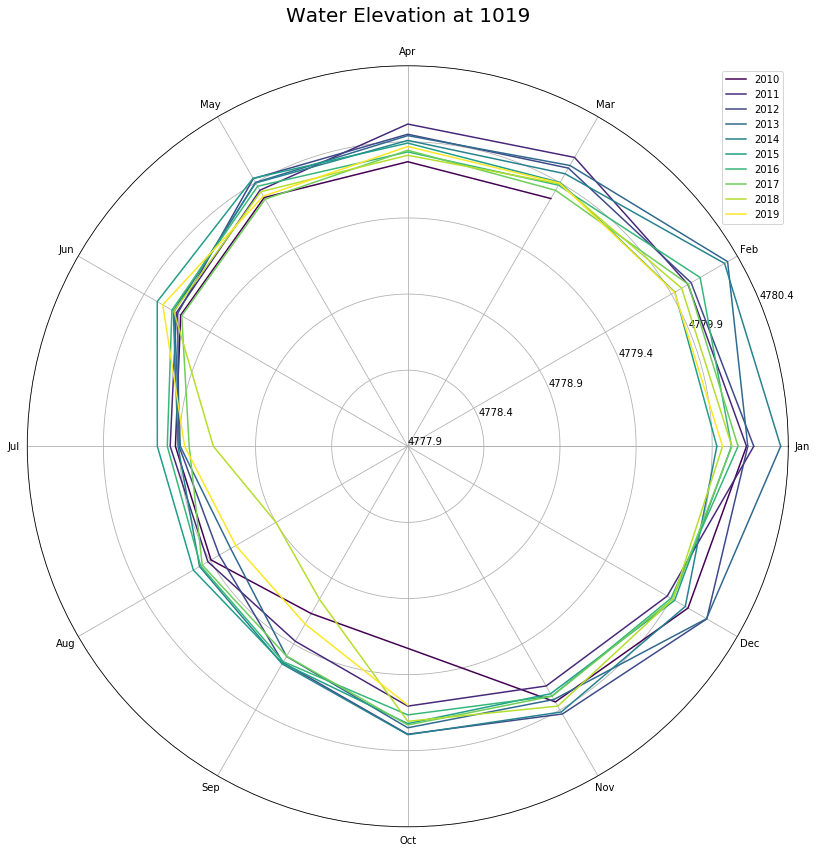

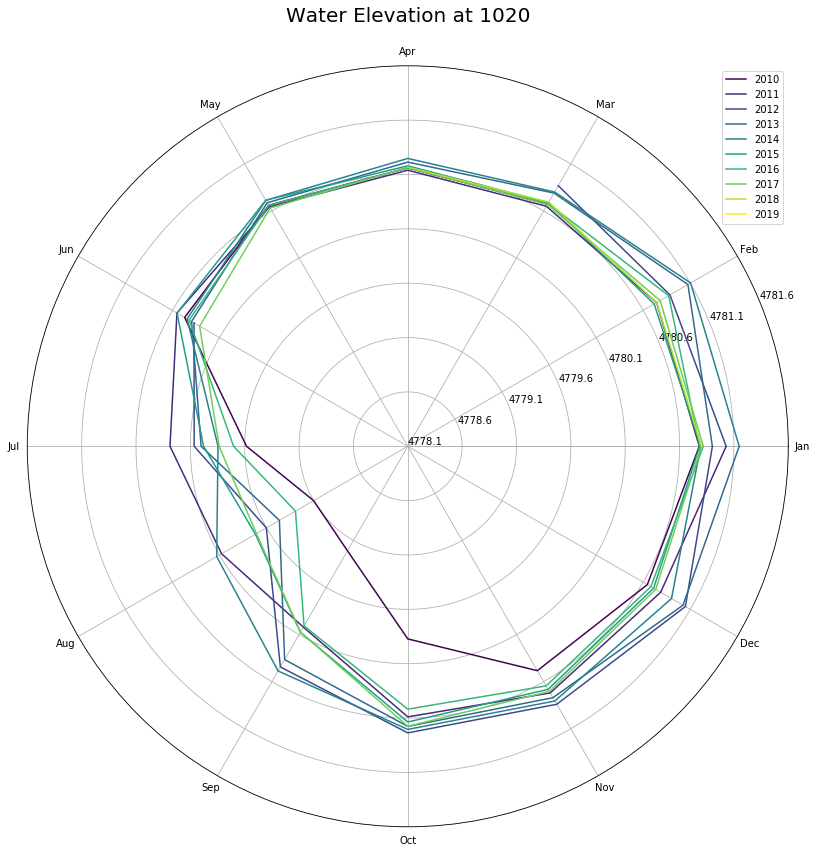

In [152]:
tempcols = []
for col in dfwy.columns:
    if '_wle' in col:
        tempcols.append(col)
        plot_circtime(dfwy,col, climvar='Water Elevation', tickint=0.5)

4794.293791666667
4794.3310833333335
4797.304708333332
4796.47375
4789.136041666666
4791.500791666666
4787.25175
4787.259
4785.009
4786.755541666666
4787.832791666665
4787.949541666666


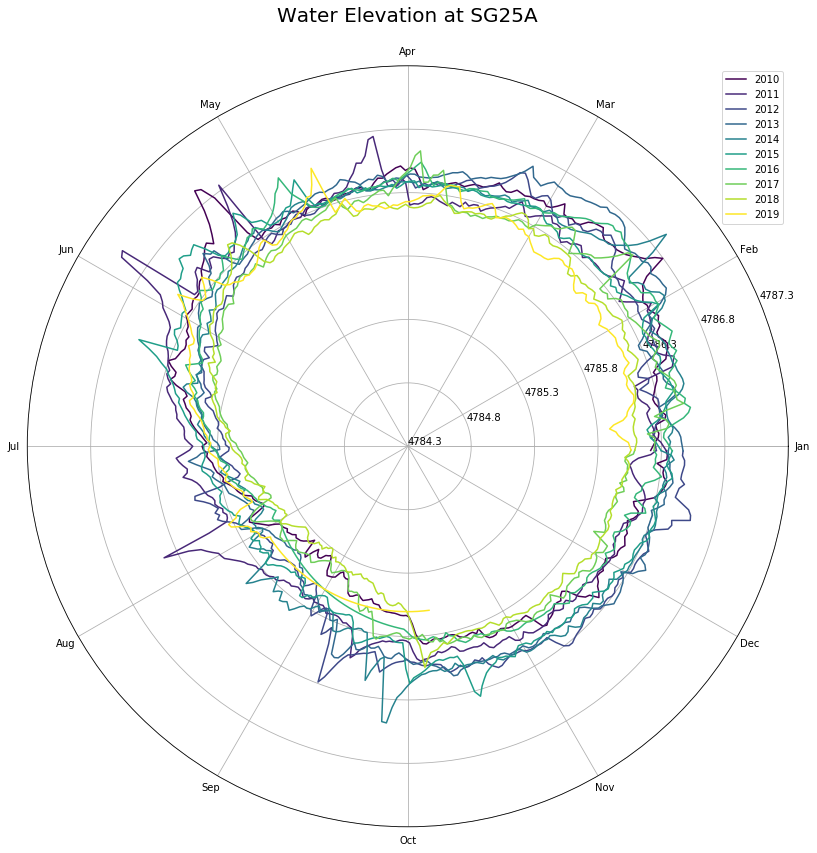

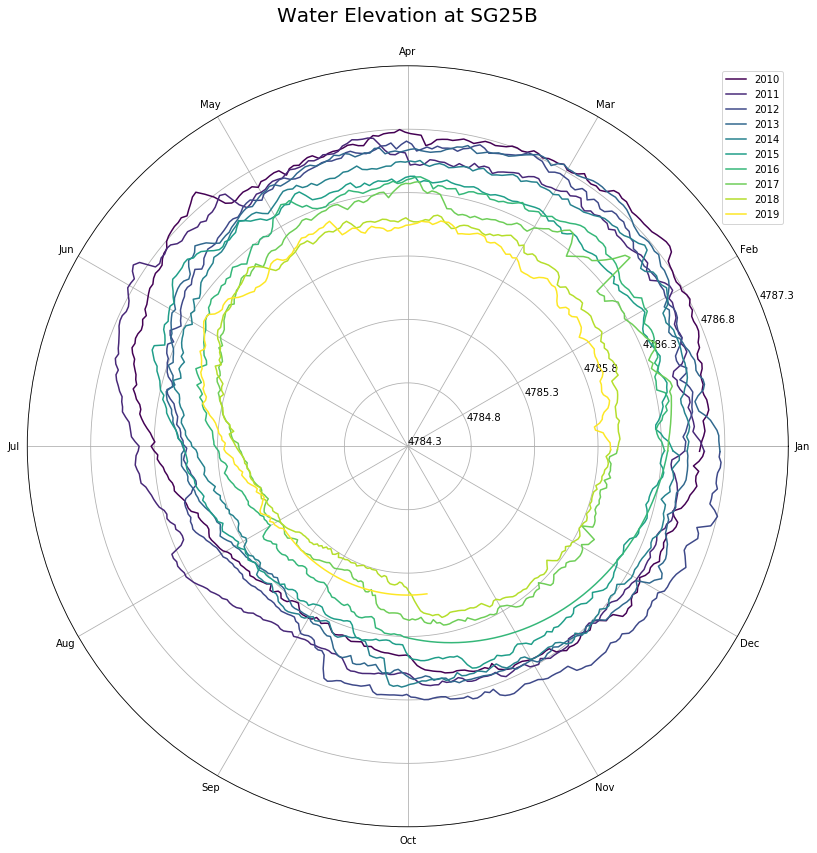

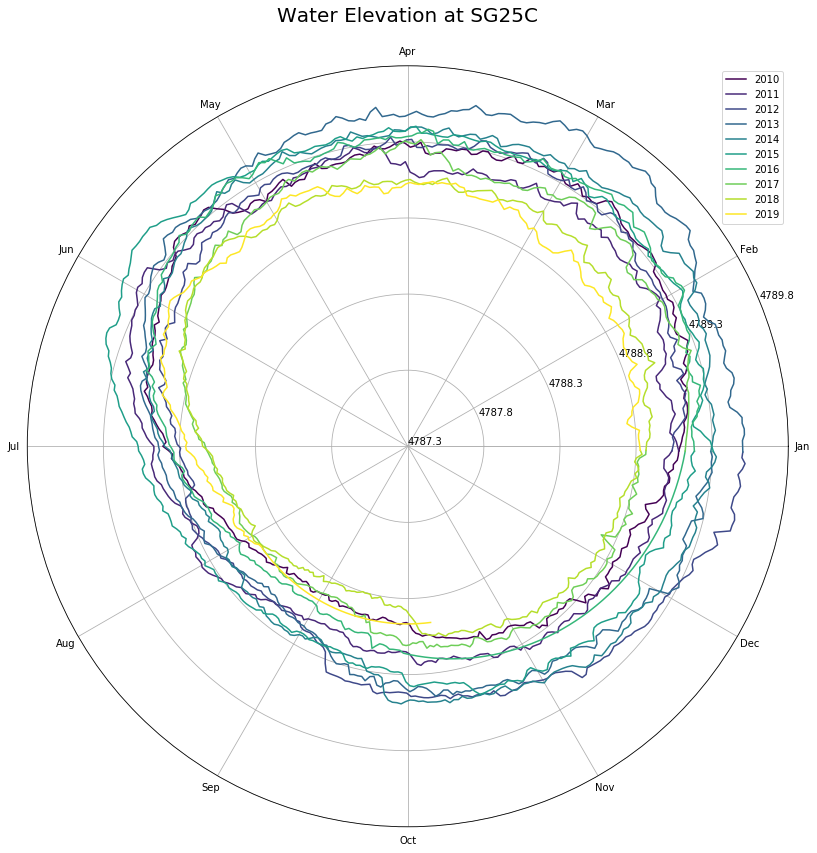

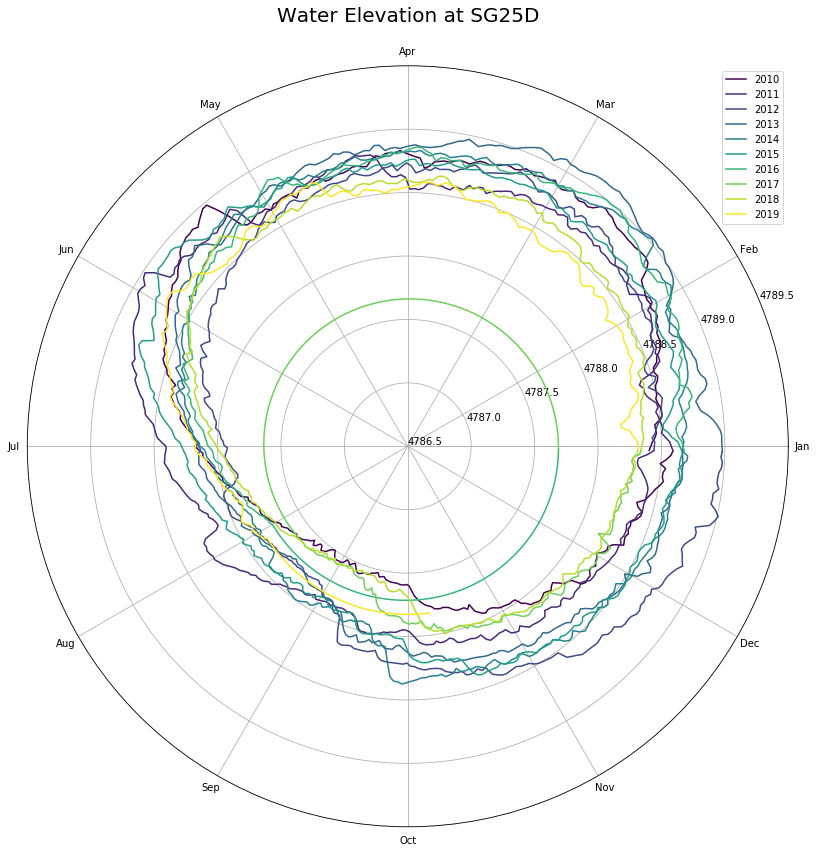

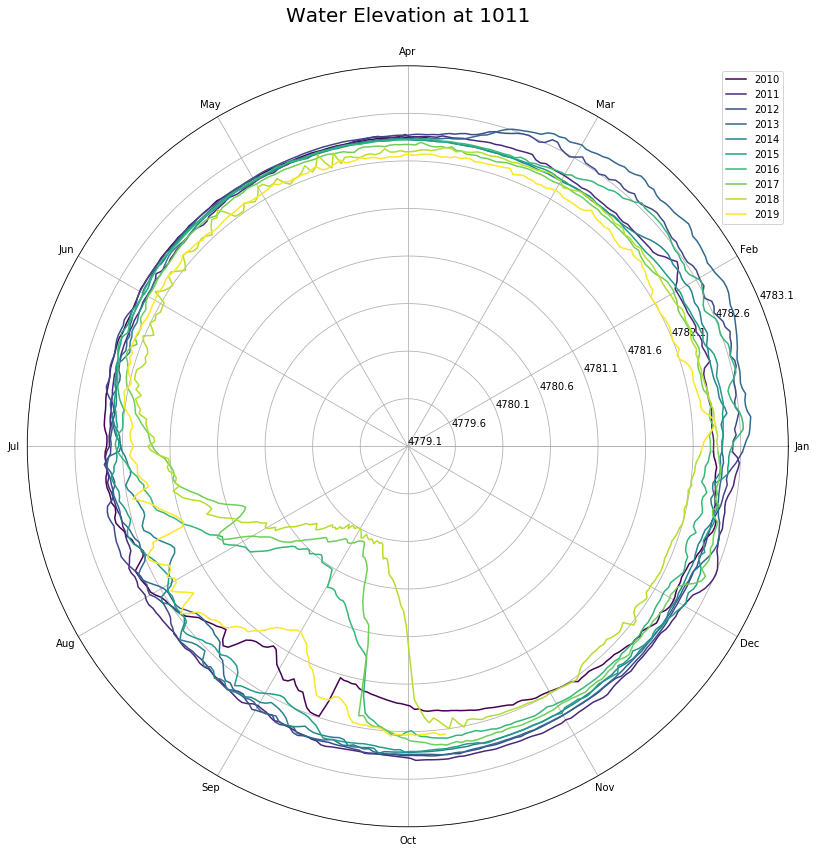

...

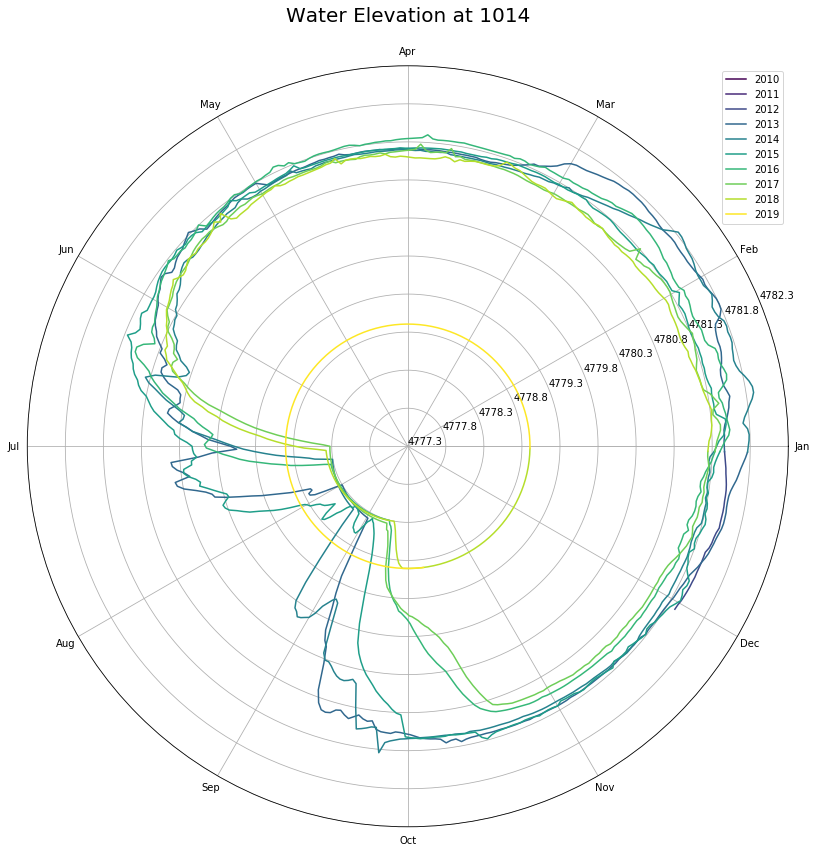

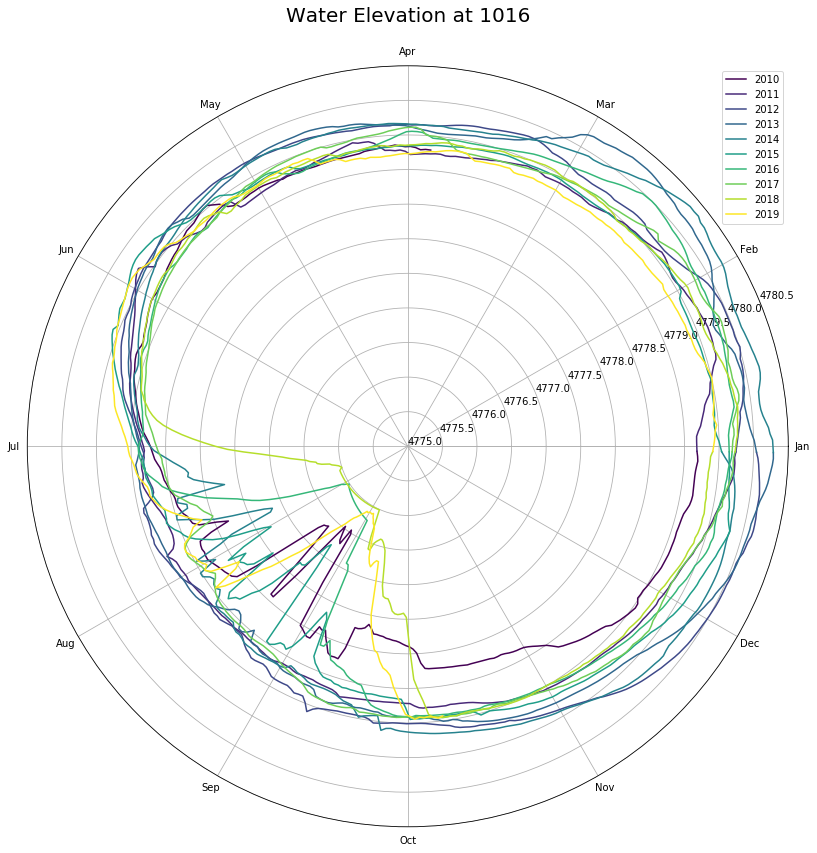

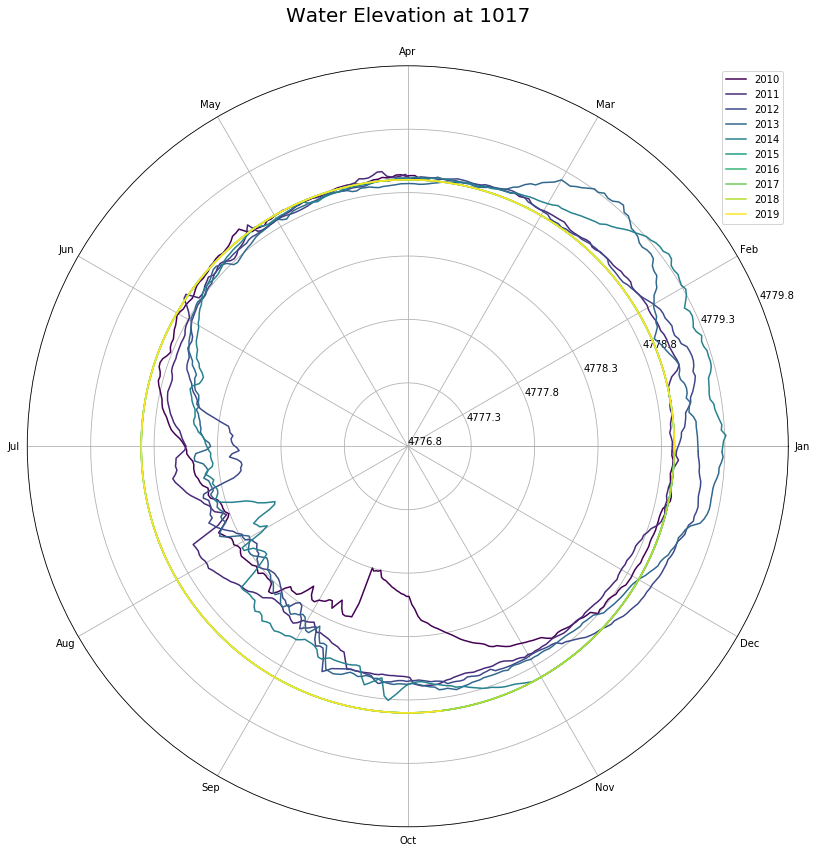

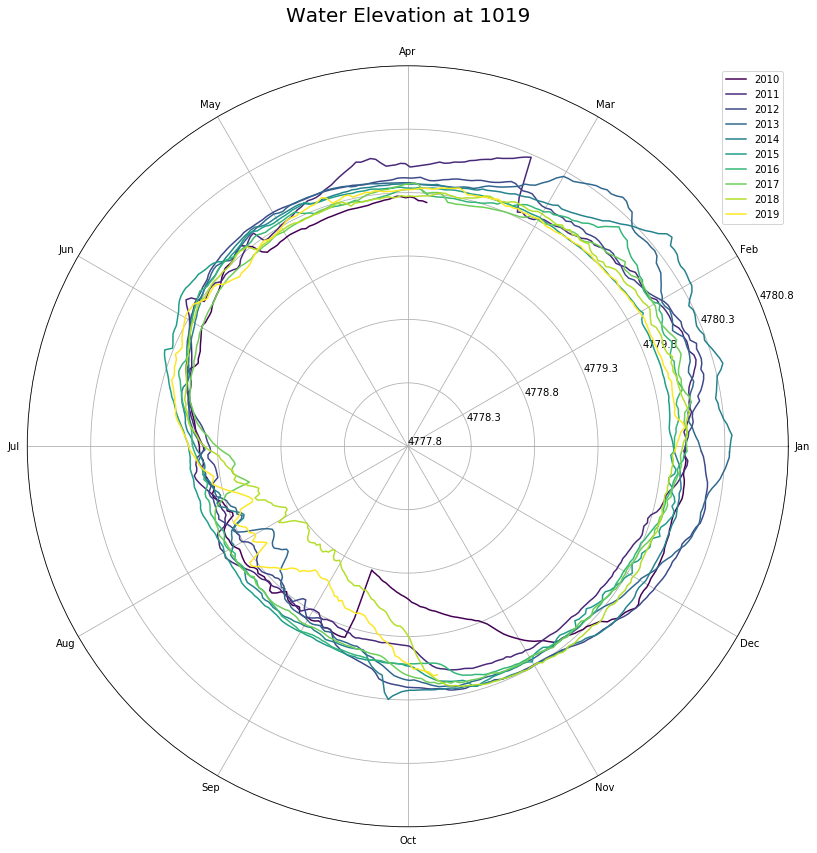

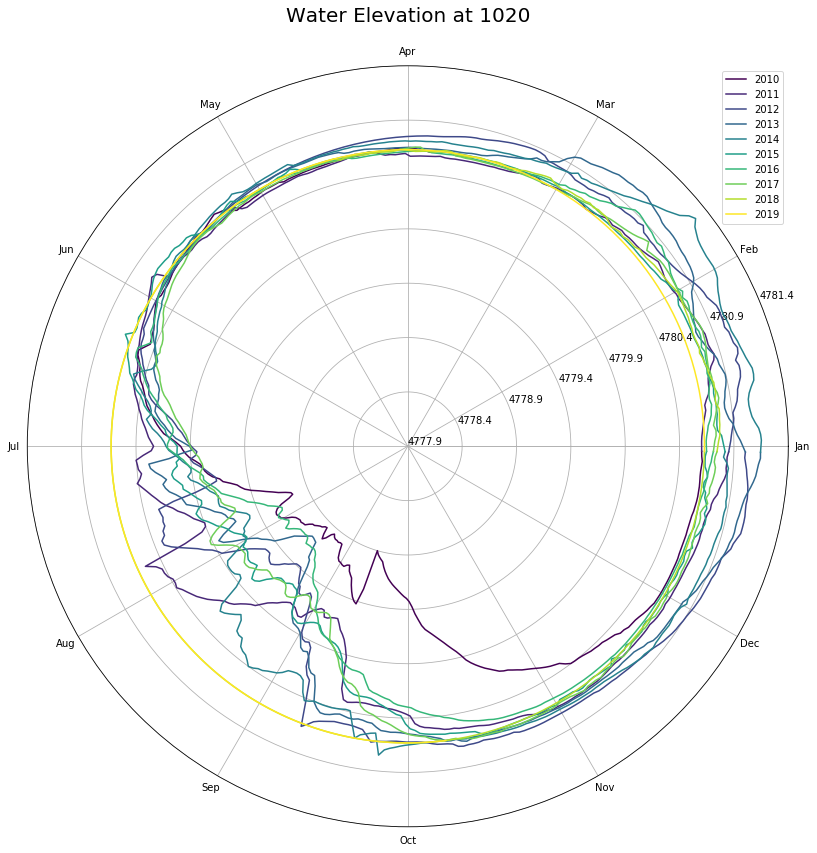

In [174]:
tempcols = []
for col in dfwy.columns:
    if '_wle' in col:
        tempcols.append(col)
        plot_circday(dfwy,col, climvar='Water Elevation', tickint=0.5)

C:\Users\Hutto\Anaconda3\envs\modeling\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



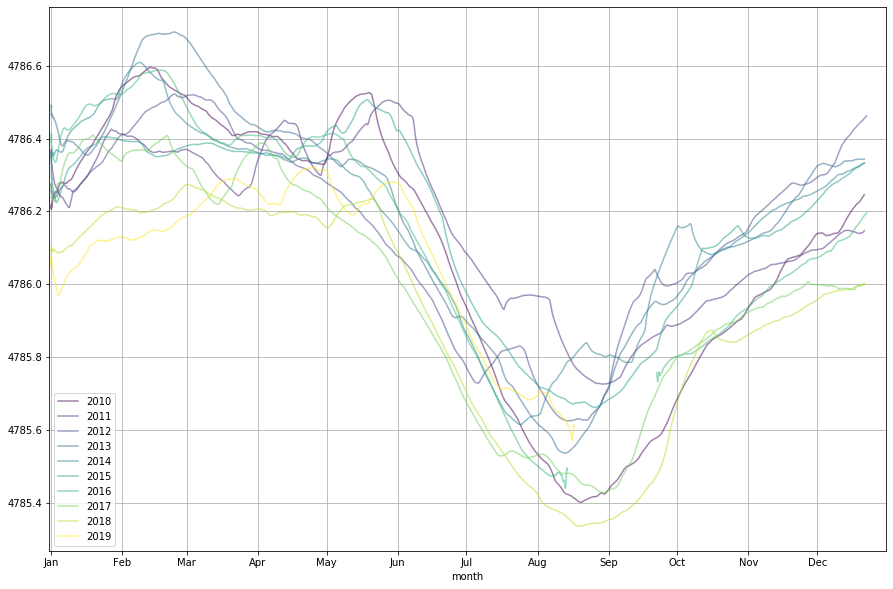

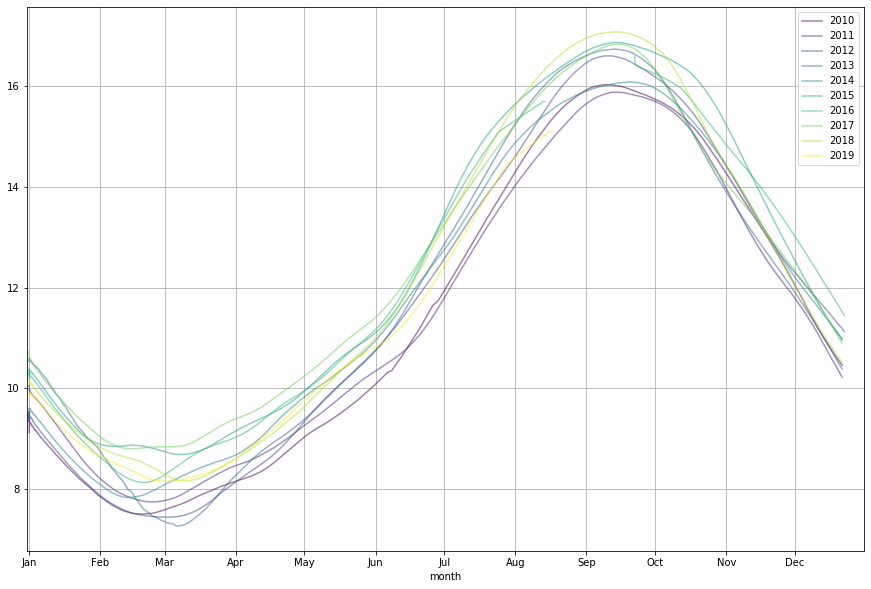

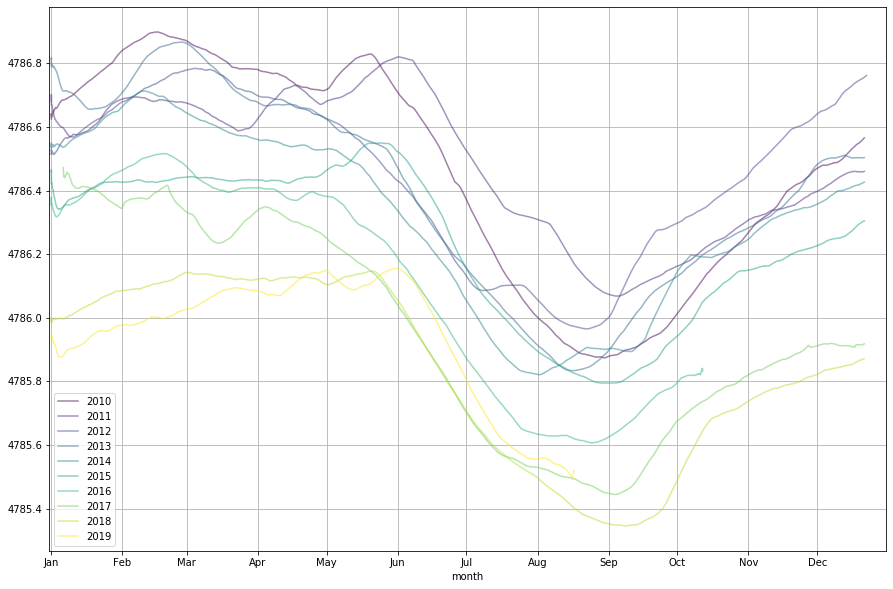

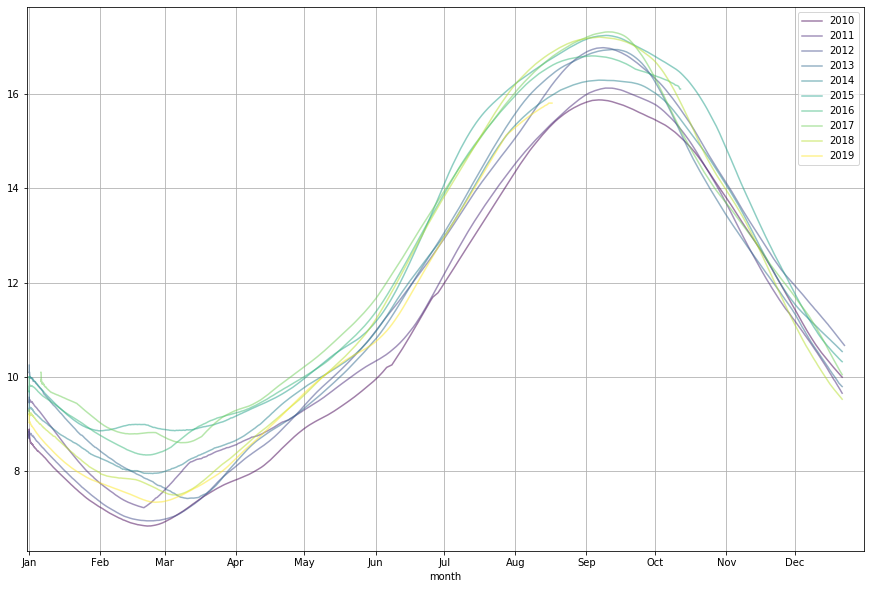

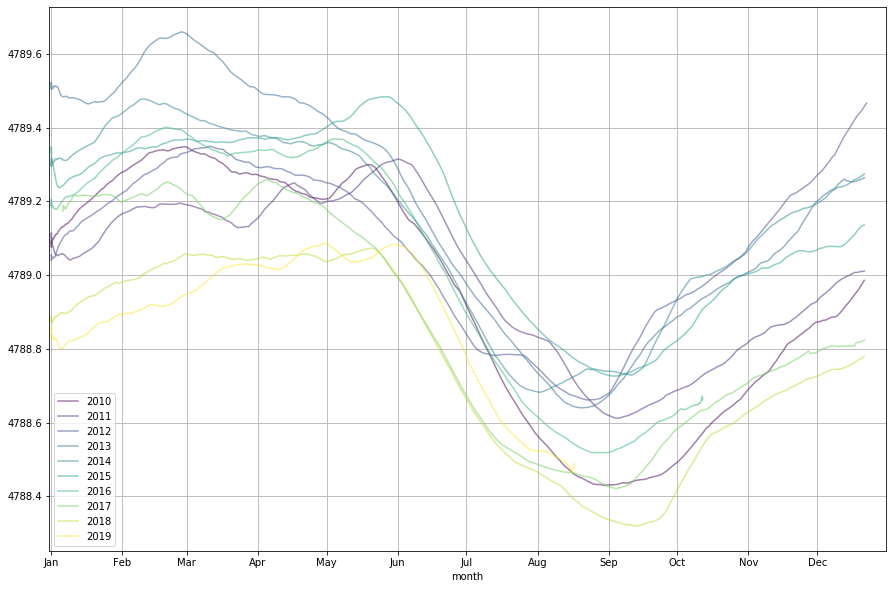

...

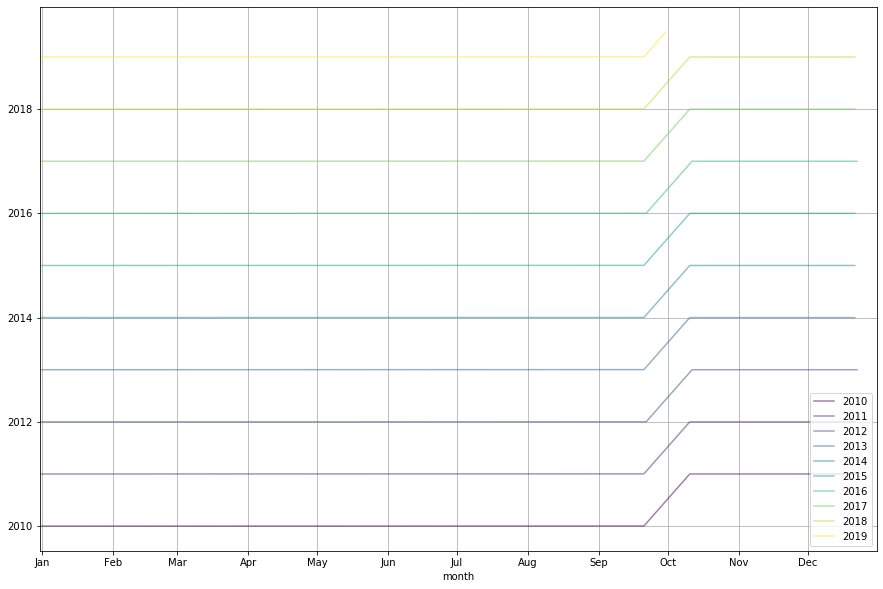

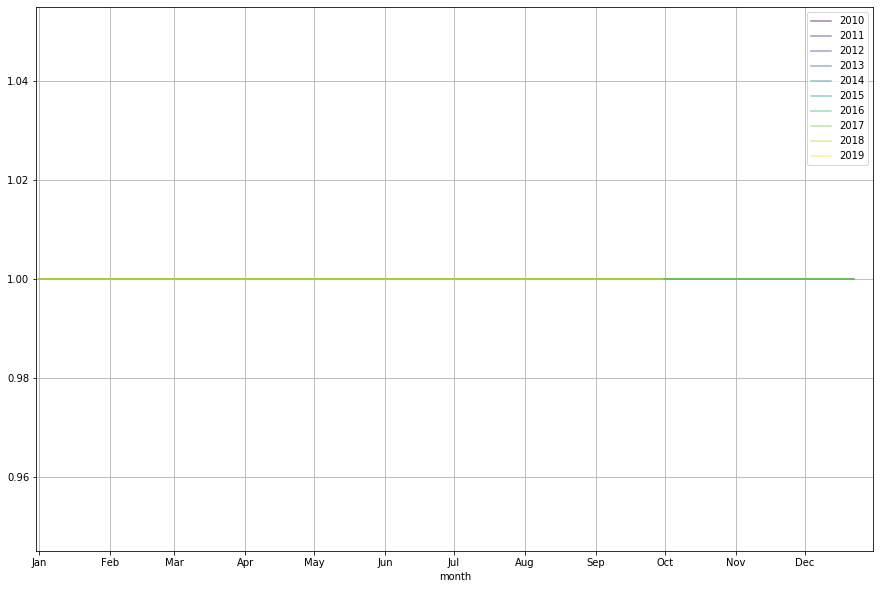

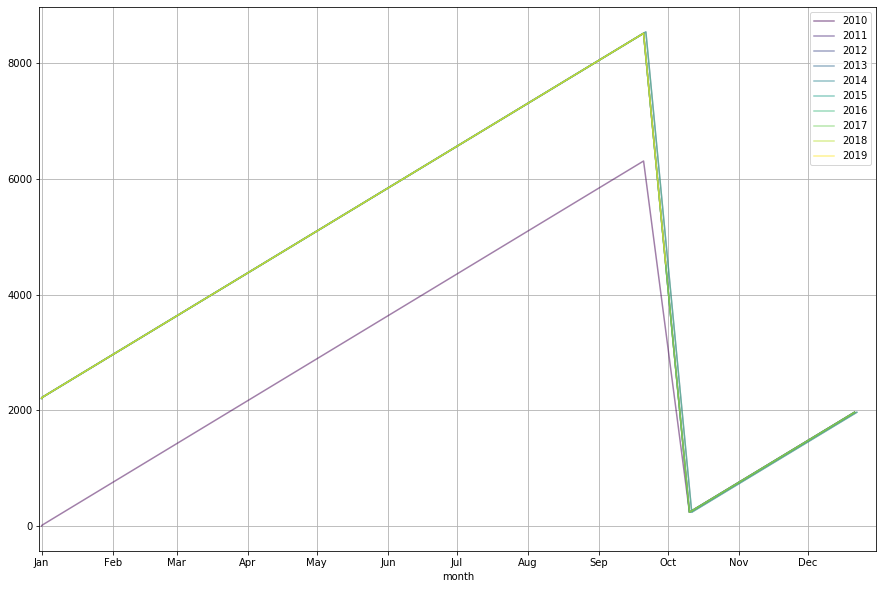

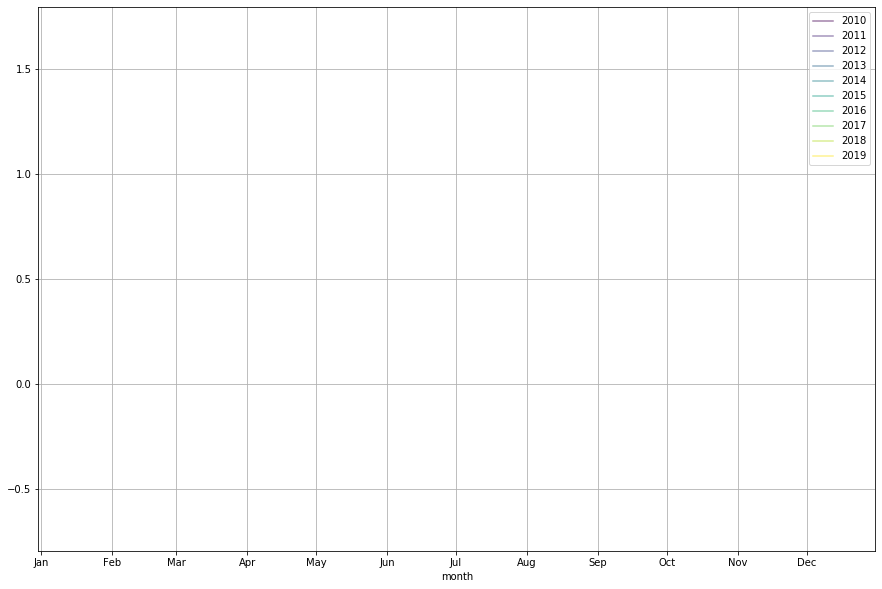

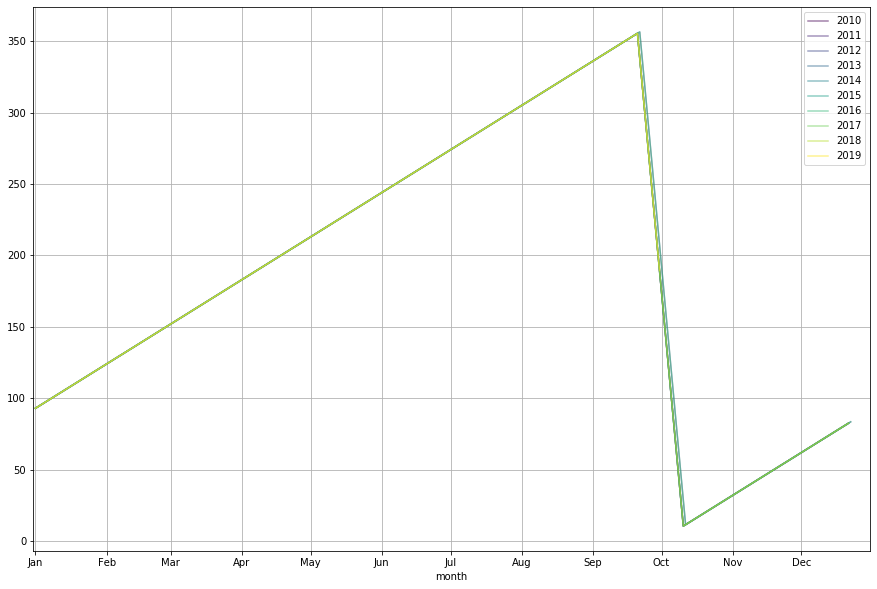

In [61]:

def plot_all_years(dfwy, val, smooth='20D', showmean=False, 
                   eachyr=True, qntile=False, mindate=None, maxdate=None):
    
    
    from pandas.plotting import register_matplotlib_converters
    register_matplotlib_converters()
    df = dfwy.copy()
    if maxdate:
        df = df[df.index <= maxdate]
    
    if mindate:
        df = df[df.index >= mindate]
    
    grpd = df.groupby(dfwy.index.dayofyear)[val]
    xm = grpd.median().index
    ym = grpd.median()
    y1 = grpd.quantile(q=0.05)
    y2 = grpd.quantile(q=0.95)

    fig, ax = plt.subplots(1,1)
    
    color=iter(plt.cm.viridis(np.linspace(0,1,len(dfwy.index.year.unique()))))
    # doy needed for smoother hydrograph; using .index.doy works below, but it creates steps
    df['doy'] = df.index.dayofyear
    
    if eachyr:
        yrlist = dfwy.index.year.unique()
        if type(eachyear) == list:
            yrlist = eachyear
        
        for year in yrlist:
            clr=next(color)
            xyr = df[df.index.year == year].rolling(smooth).mean()['doy']
            yyr = df[df.index.year == year].rolling(smooth).mean()[val]
            ax.plot(xyr,yyr,alpha=0.5,label=year, c=clr)
    
    if showmean:
        ax.plot(xm,ym,label='Mean')

    if qntile:
        ax.fill_between(xm,y1,y2, label='90% of data values', alpha=0.2, linewidth=0)

    ax.legend()
    ax.grid(True)

    ax.set_xlabel('month')
    dtrng = pd.date_range('1/1/2014','12/31/2014',freq='1MS')
    datelabels = [d.strftime('%b') for d in dtrng]
    ax.set_xticks([i.dayofyear for i in dtrng])#dtrng)#,rotation=90)
    ax.set_xticklabels(datelabels)
    ax.set_xlim(0,365)
    return fig, ax

for col in dfwy:
    plot_all_years(dfwy, col)

(<Figure size 1080x720 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1ceb4d00940>)

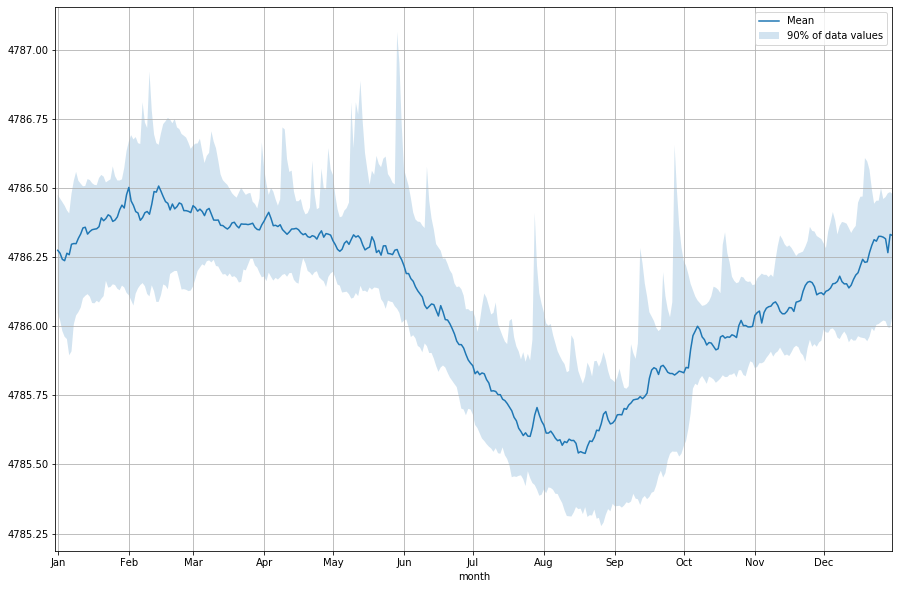

In [60]:
plot_all_years(dfwy, val, eachyr=False, showmean=True, qntile=True)

In [ ]:
MainUSGS.loc[:,'month'] = MainUSGS.index.month
MainUSGS.loc[:,'doy'] = MainUSGS.index.dayofyear
MainUSGS['water year'] = MainUSGS.index.shift(-9,freq='M').year+1
#MainUSGS['water year doy'] = 0
MainUSGS.loc[MainUSGS.index[0],'water year doy'] = int(1)
for i in range(1,len(MainUSGS.index)):
    if MainUSGS.loc[MainUSGS.index[i],'water year'] == MainUSGS.loc[MainUSGS.index[i-1],'water year']:  
        MainUSGS.loc[MainUSGS.index[i],'water year doy'] = int(MainUSGS.loc[MainUSGS.index[i-1],'water year doy'] + 1)
    else:
        MainUSGS.loc[MainUSGS.index[i],'water year doy'] = int(1)

In [ ]:
grpd = dfwy.groupby(['doy'])['value']
xm = grpd.median().index
ym = grpd.median()
ya = grpd.mean()
y1 = grpd.quantile(q=0.05)
y2 = grpd.quantile(q=0.95)
maincrkUSGS = ym
meanBF = grpd.mean()[182:334].mean()
med_q = np.sum(ym*86400.00)*2.29569e-5 #cfs to cfd to ac-ft/yr
avg_q = np.sum(ya*86400.00)*2.29569e-5 #cfs to cfd to ac-ft/yr
high_q = np.sum(y2*86400.00)*2.29569e-5 #cfs to cfd to ac-ft/yr
low_q = np.sum(y1*86400.00)*2.29569e-5 #cfs to cfd to ac-ft/yr
print("""Median Q = {:0.0f} ac-ft/yr
Average Q = {:0.0f} ac-ft/yr
Mean Baseflow Discharge (Jul-Nov) = {:0.1f} cfs
Max Q = {:0.0f} ac-ft/yr
Min Q = {:0.0f} ac-ft/yr
""".format(med_q,avg_q,meanBF,high_q,low_q))

rcParams.update(inline_rc)
rcParams['figure.figsize'] = 15, 10
rcParams['font.size'] = 14
rcParams['pdf.fonttype'] = 42

plt.figure()
plt.plot(xm,ym, label='median')
#plt.plot(xm,ya, label='mean')
plt.fill_between(xm,y1,y2, label='90% of data values', alpha=0.2, linewidth=0)

plt.title("Monthly Summary of Discharge Data at {:} from {:%m/%d/%Y} to {:%m/%d/%Y}".format('USGS 10158500', 
                                                                                           MainUSGS.index.min(),
                                                                                           MainUSGS.index.max()))

minQ = min(MainUSGS['value'])
maxQ = max(MainUSGS['value'])
meanQ = np.mean(MainUSGS['value'])
medianQ = np.median(MainUSGS['value'])
stdQ = np.std(MainUSGS['value'])


plt.legend()
plt.grid()

plt.xlabel('month')
dtrng = pd.date_range('1/1/2014','12/31/2014',freq='1M')
datelabels = [d.strftime('%b') for d in dtrng]
plt.xticks(range(0,365,30), datelabels)#dtrng)#,rotation=90)
plt.xlim(0,365)
plt.text(200, 60,
         """
         Mean Discharge = {:0.1f} cfs\n
         Median Discharge = {:0.1f} cfs\n
         Standard Deviation = {:0.1f} cfs\n
         Minimum Discharge = {:0.1f} cfs\n
         Maximum Discharge = {:0.0f} cfs""".format(meanQ,medianQ,stdQ,minQ,maxQ))
plt.ylabel('Discharge (cfs)')
plt.show()
#plt.savefig(figplace + 'MainCreekMonthlyHydroGraph.svg')
#plt.savefig(figplace + 'MainCreekMonthlyHydroGraph.pdf')

In [ ]:
nw = wa.nwis('dv',[10158500],'sites')
MainUSGS = nw.data
MainUSGS.loc[:,'month'] = MainUSGS.index.month
MainUSGS.loc[:,'doy'] = MainUSGS.index.dayofyear
MainUSGS['water year'] = MainUSGS.index.shift(-9,freq='M').year+1
#MainUSGS['water year doy'] = 0
MainUSGS.loc[MainUSGS.index[0],'water year doy'] = int(1)
for i in range(1,len(MainUSGS.index)):
    if MainUSGS.loc[MainUSGS.index[i],'water year'] == MainUSGS.loc[MainUSGS.index[i-1],'water year']:  
        MainUSGS.loc[MainUSGS.index[i],'water year doy'] = int(MainUSGS.loc[MainUSGS.index[i-1],'water year doy'] + 1)
    else:
        MainUSGS.loc[MainUSGS.index[i],'water year doy'] = int(1)

In [ ]:
MainUSGS['cfd'] = MainUSGS['value']*86400.0
year_Main_summary = MainUSGS.groupby(MainUSGS.index.year)['cfd'].sum()*2.29569e-5
wateryear_Main_summary = MainUSGS.groupby(MainUSGS['water year'])['cfd'].sum()*2.29569e-5
wateryear_Main_summary.to_clipboard()

In [ ]:
grpd = MainUSGS.groupby(['water year doy'])['value']
xm = grpd.median().index
ym = grpd.median()
y1 = grpd.quantile(q=0.05)
y2 = grpd.quantile(q=0.95)

for year in MainUSGS['water year'].unique():
    xyr = MainUSGS[MainUSGS['water year'] == year]['water year doy']
    yyr = MainUSGS[MainUSGS['water year'] == year]["value"]
    plt.plot(xyr,yyr,alpha=0.3,label=year)
plt.plot(xm,ym,label='Mean')


plt.fill_between(xm,y1,y2, label='90% of data values', alpha=0.2, linewidth=0)

plt.legend()
plt.grid()

plt.xlabel('month')
dtrng = pd.date_range('10/1/2014','9/30/2015',freq='1M')
datelabels = [d.strftime('%b') for d in dtrng]
plt.xticks(range(0,365,30), datelabels)#dtrng)#,rotation=90)
plt.xlim(0,365)